In [23]:
# 9,CongestionWindow
# 17,SmoothedRTT
# 20,RetransmissionTimeout
# 21,SocketSendBufferSize
# 22,SocketSendBufferBytes
# 23,SocketReceiveBufferSize
# 24,SocketReceiveBufferBytes
# 25,UnacknowledgedBytes

# # With ECN and no ECN

In [24]:
import numpy as np
import matplotlib.pyplot as plt
import time
import pandas as pd
import matplotlib.pyplot as plt
# from gym import wrappers
# from gym import spaces
import math
import random
import re
import os
import sys
import seaborn as sns

# import gym
# import tensorflow as tf
# from tensorflow.keras import layers
col = ['Direction', 'Hash', 'Time', 'LocalIP', 'LocalPort', 'ForeignIP', 'ForeignPort', 'SlowStartThreshold', 'CongestionWindow', 'BandwidthControlledWindow', 'SendingWindow', 'ReceiveWindow', 'SendingWindowScalingFactor', 'ReceiveWindowScalingFactor', 'TCPFiniteStateMachine',
       'MaximumSegmentSize', 'SmoothedRTT', 'SACKEnabled', 'TCPFlags', 'RetransmissionTimeout', 'SocketSendBufferSize', 'SocketSendBufferBytes', 'SocketReceiveBufferSize', 'SocketReceiveBufferBytes', 'UnacknowledgedBytes', 'ReassemblyQueue', 'Flowid', 'Flowtype']


In [25]:
import re

def contains_1_or_2(input_string):
    if '2' in input_string:
        return 2
    elif '1' in input_string:
        return 1
    else:
        return 0

# Example usage:
test_string = "abc123xyz"
result = contains_1_or_2(test_string)
print("Result:", result)


Result: 2


In [26]:
# plt.rcParams.update({'figure.figsize':(8,6), 'figure.dpi':100, 'font.size':16})

In [27]:
def functionfilenameandpath(path='./', extension='.log'):
    filepaths = []
    filenames = []

    for root, _, files_list in os.walk(path):
        for file_name in files_list:
            if file_name.endswith(extension):
                file_name_path = os.path.join(root, file_name)
                filenames.append(file_name)
                filepaths.append(file_name_path)

    return filenames, filepaths

In [28]:
folderpath="./datatest1"
filenames,filepaths=functionfilenameandpath(folderpath,'.log')

filepaths.sort()
filenames.sort()
print(filenames)

['codel1_ecn.siftr.log', 'codel1_noecn.siftr.log', 'codel2_ecn.siftr.log', 'codel2_noecn.siftr.log', 'fqcodel1_ecn.siftr.log', 'fqcodel1_noecn.siftr.log', 'fqcodel2_ecn.siftr.log', 'fqcodel2_noecn.siftr.log', 'fqpie1_ecn.siftr.log', 'fqpie1_noecn.siftr.log', 'fqpie2_ecn.siftr.log', 'fqpie2_noecn.siftr.log', 'l4s1_ecn.siftr.log', 'l4s1_noecn.siftr.log', 'l4s2_ecn.siftr.log', 'l4s2_noecn.siftr.log', 'pie1_ecn.siftr.log', 'pie1_noecn.siftr.log', 'pie2_ecn.siftr.log', 'pie2_noecn.siftr.log']


In [29]:
# for index in range(len(filenames)):
#     print("..................>>>>>>>>>>>>>>>>>")
#     print(filenames[index])
#     print(contains_1_or_2(filenames[index]))
#     print("..................>>>>>>>>>>>>>>>>>")

In [30]:
def remove_outliers_iqr(df, column_name):
    """
    Remove outliers from a specified column in a DataFrame using the IQR method.
    
    Parameters:
    df (pd.DataFrame): The DataFrame.
    column_name (str): The name of the column from which to remove outliers.
    
    Returns:
    pd.DataFrame: The DataFrame with outliers removed.
    """
    Q1 = df[column_name].quantile(0.25)
    Q3 = df[column_name].quantile(0.75)
    IQR = Q3 - Q1
    
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    return df[(df[column_name] >= lower_bound) & (df[column_name] <= upper_bound)]

codel1_ecn.siftr.log
count    8605.000000
mean        0.153033
std         0.022979
min         0.000000
25%         0.135625
50%         0.152500
75%         0.168437
max         0.216875
Name: SmoothedRTT, dtype: float64
14893    0.00000
14939    0.16125
14940    0.16125
14986    0.15750
14987    0.15750
Name: SmoothedRTT, dtype: float64
46111    0.147813
46112    0.147813
46131    0.144375
46133    0.144375
46134    0.144375
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


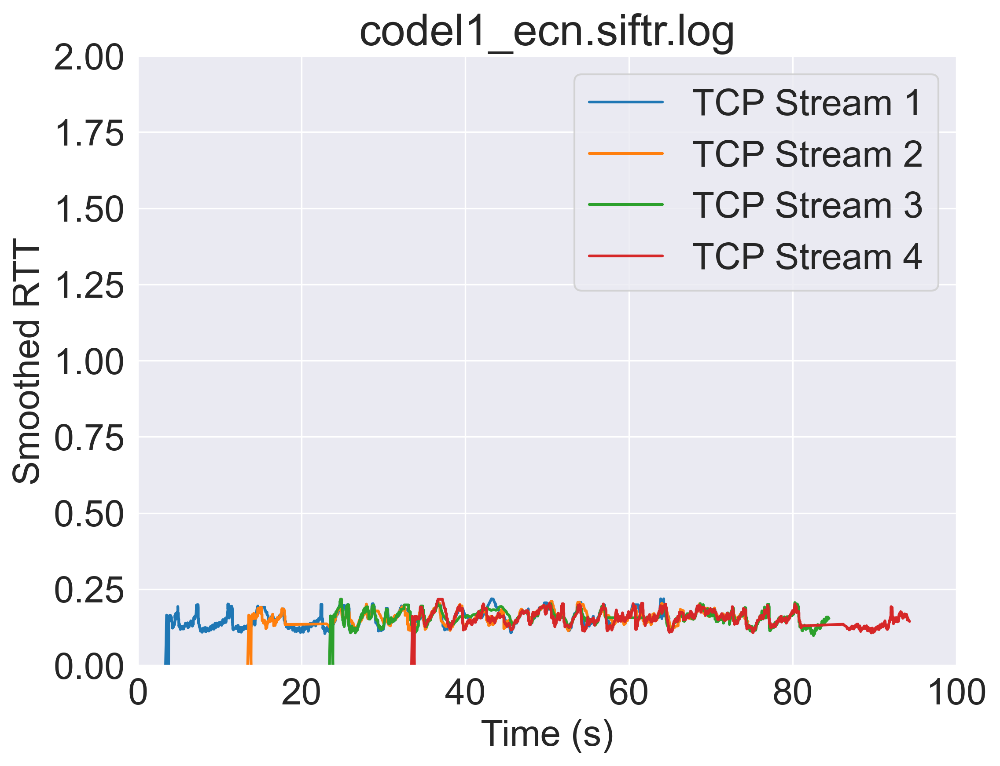

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


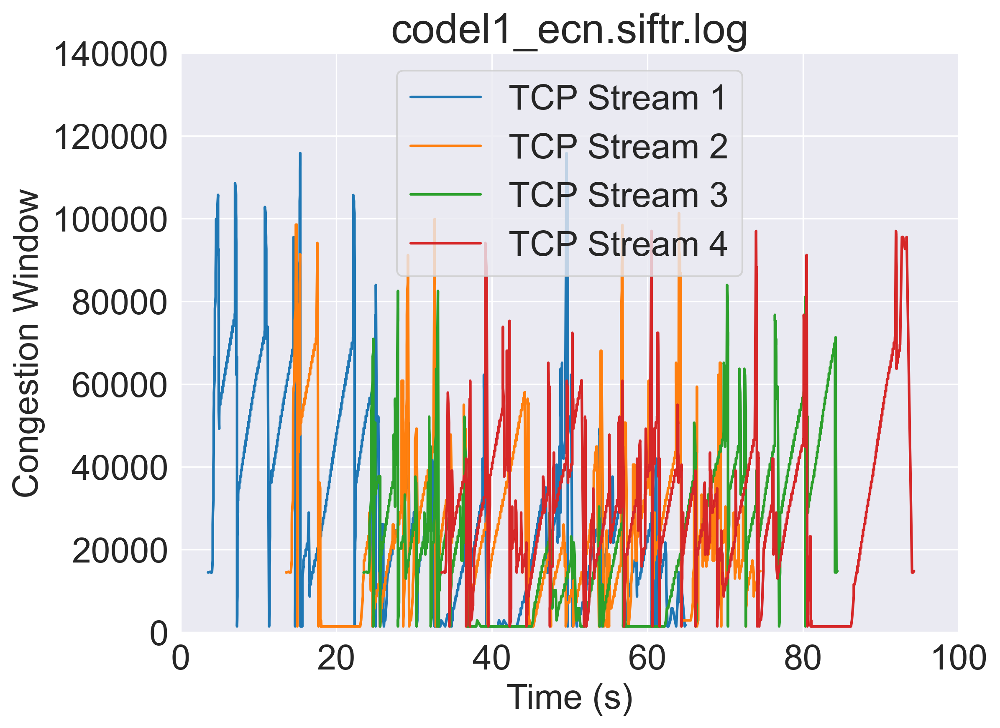

codel1_noecn.siftr.log
count    9802.000000
mean        0.167516
std         0.023076
min         0.000000
25%         0.151562
50%         0.167813
75%         0.186250
max         0.218750
Name: SmoothedRTT, dtype: float64
16826    0.000000
16931    0.149375
16942    0.149375
17056    0.154688
17057    0.154688
Name: SmoothedRTT, dtype: float64
54366    0.159688
54370    0.151250
54373    0.151250
54374    0.151250
54375    0.151250
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


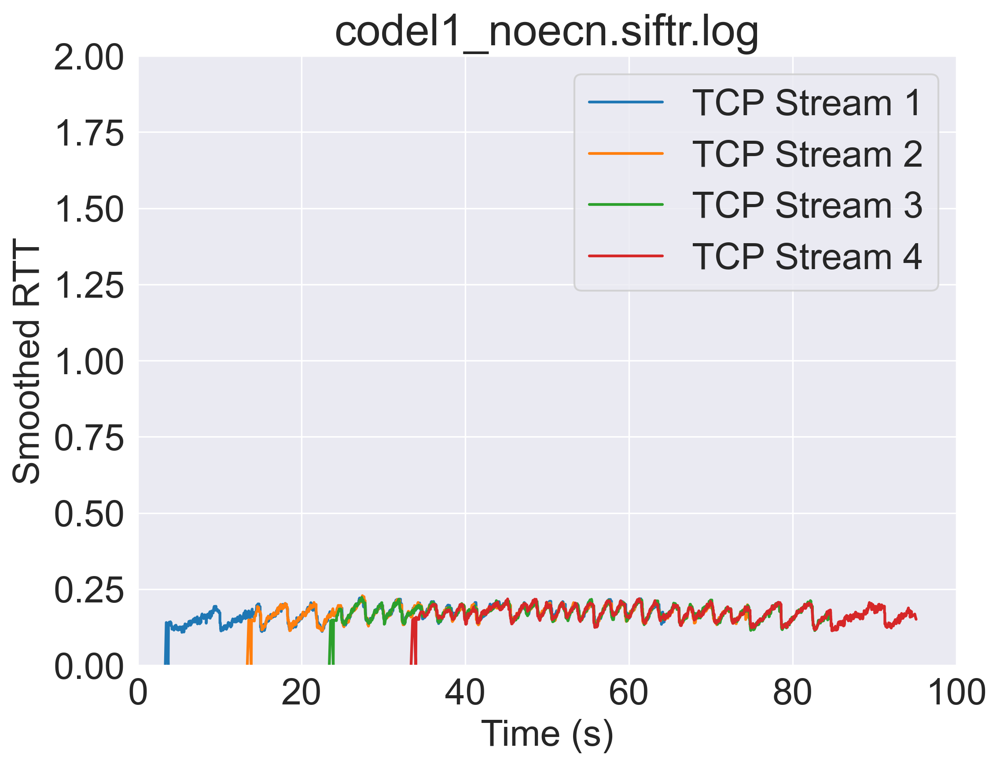

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


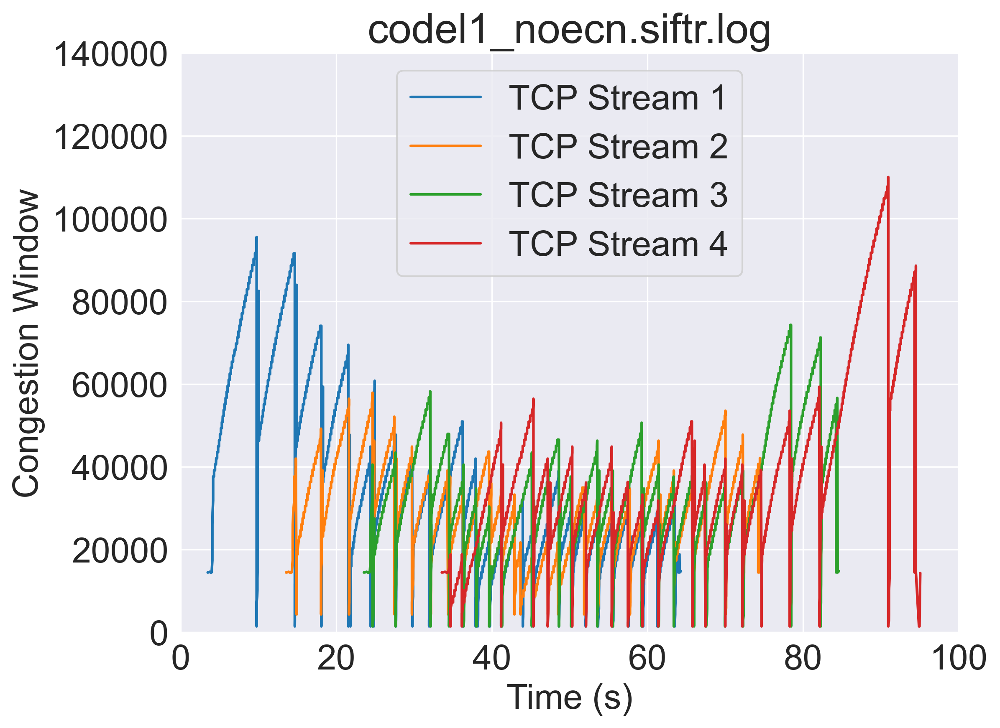

codel2_ecn.siftr.log
count    1049.000000
mean        0.908162
std         0.281107
min         0.000000
25%         0.680937
50%         0.825313
75%         1.166250
max         1.417188
Name: SmoothedRTT, dtype: float64
2146    0.000000
2205    0.248438
2206    0.248438
2271    0.356250
2272    0.356250
Name: SmoothedRTT, dtype: float64
6757    0.483438
6758    0.483438
6786    0.465625
6788    0.465625
6789    0.465625
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


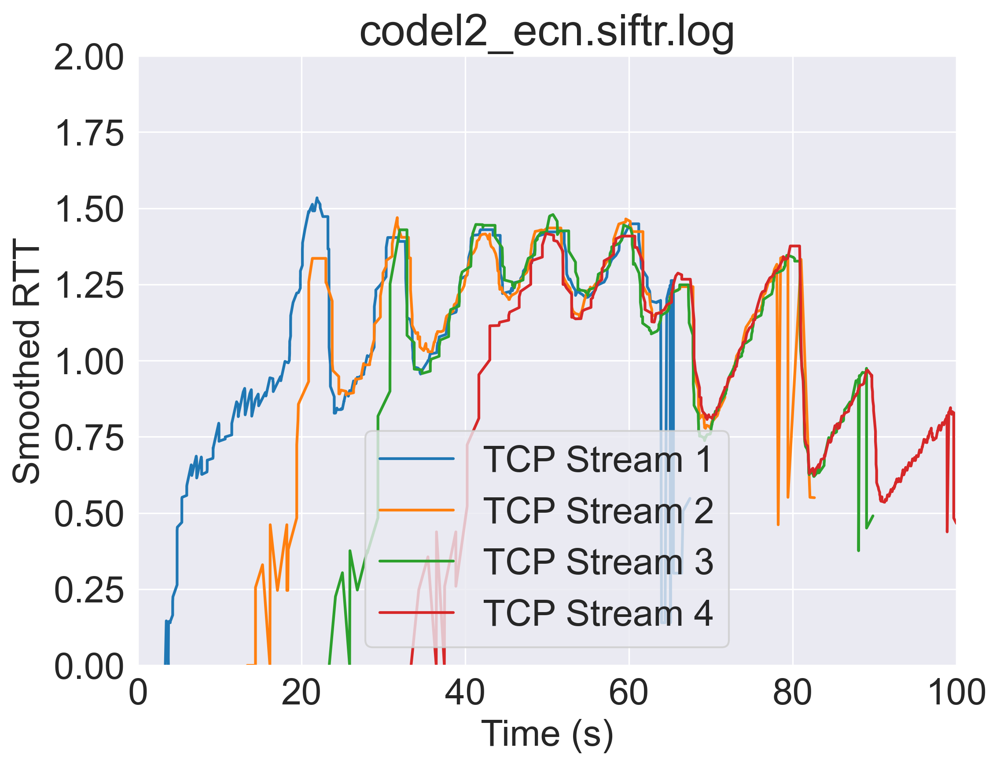

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


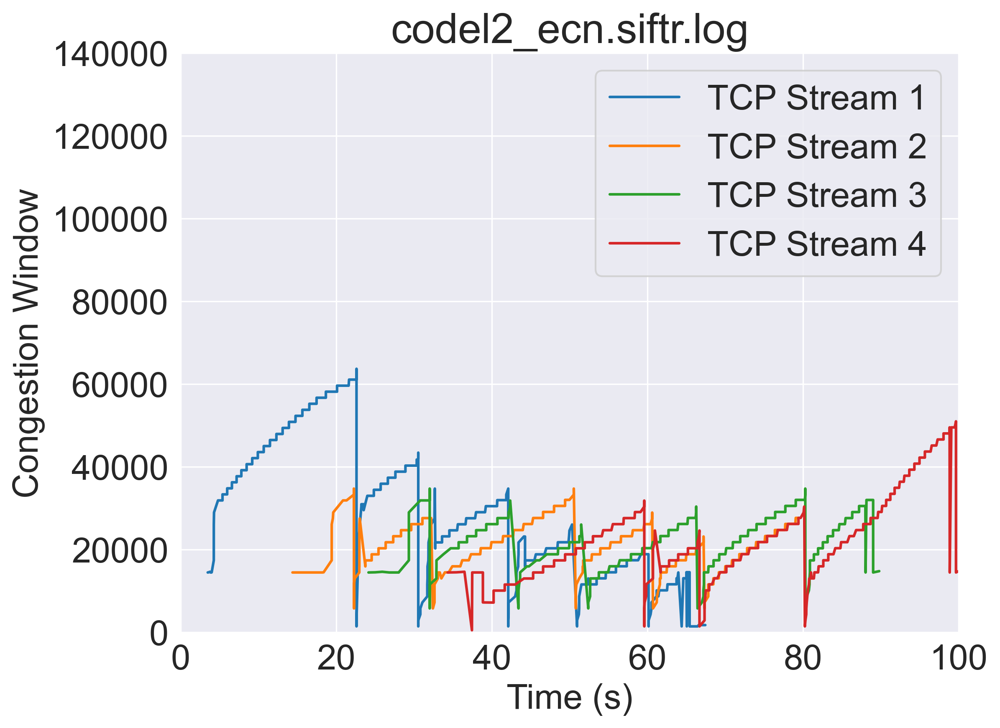

codel2_noecn.siftr.log
count    1037.000000
mean        1.014398
std         0.221920
min         0.000000
25%         0.830313
50%         1.035937
75%         1.184063
max         1.482500
Name: SmoothedRTT, dtype: float64
2119    0.000000
2184    0.000000
2186    0.877812
2196    0.877812
2269    0.900625
Name: SmoothedRTT, dtype: float64
6686    0.95000
6687    0.95000
6728    0.89875
6730    0.89875
6731    0.89875
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


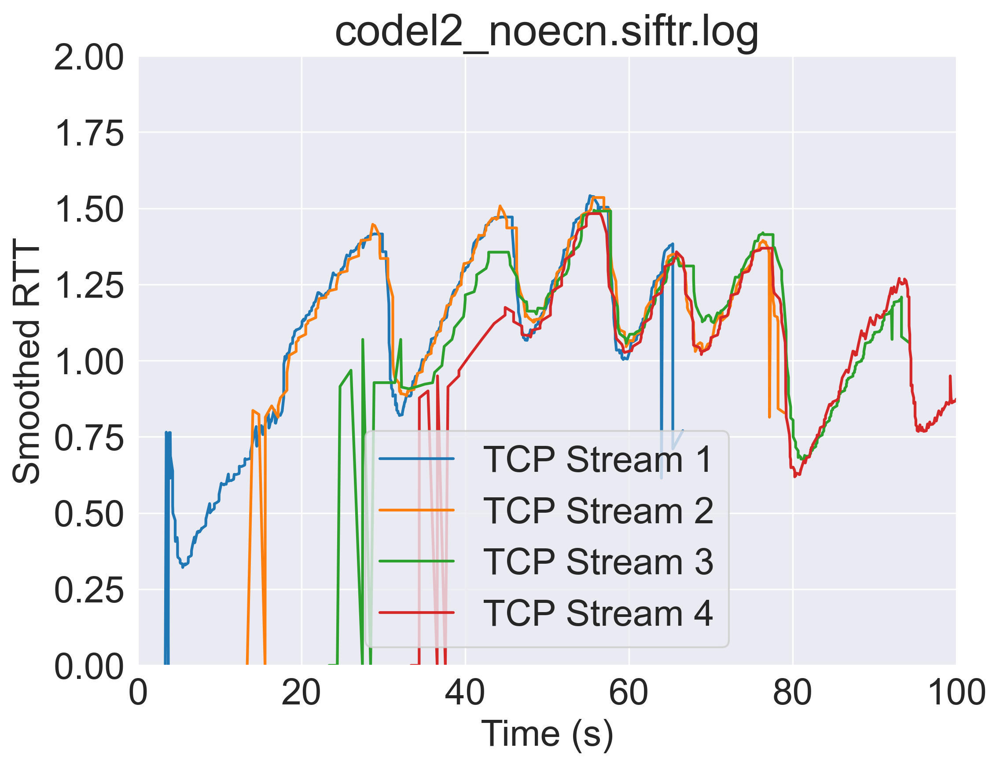

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


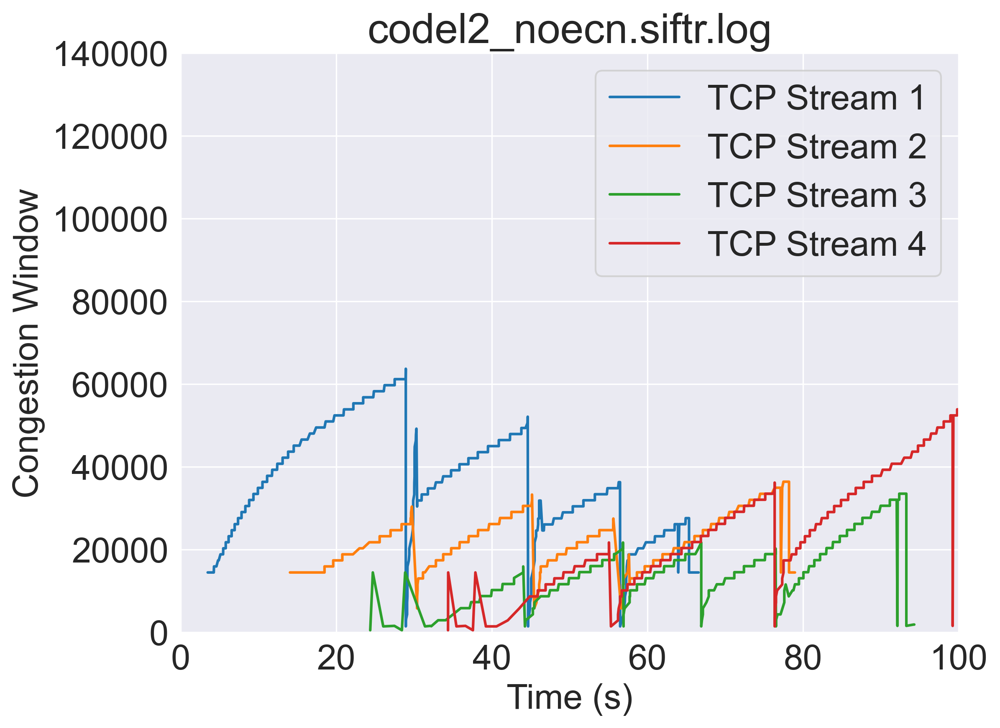

fqcodel1_ecn.siftr.log
count    9647.000000
mean        0.163134
std         0.023419
min         0.000000
25%         0.145000
50%         0.165000
75%         0.180312
max         0.217188
Name: SmoothedRTT, dtype: float64
16914    0.000000
17578    0.000000
17689    0.140937
17690    0.140937
17831    0.145937
Name: SmoothedRTT, dtype: float64
53821    0.149062
53822    0.149062
53877    0.144375
53879    0.144375
53880    0.144375
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


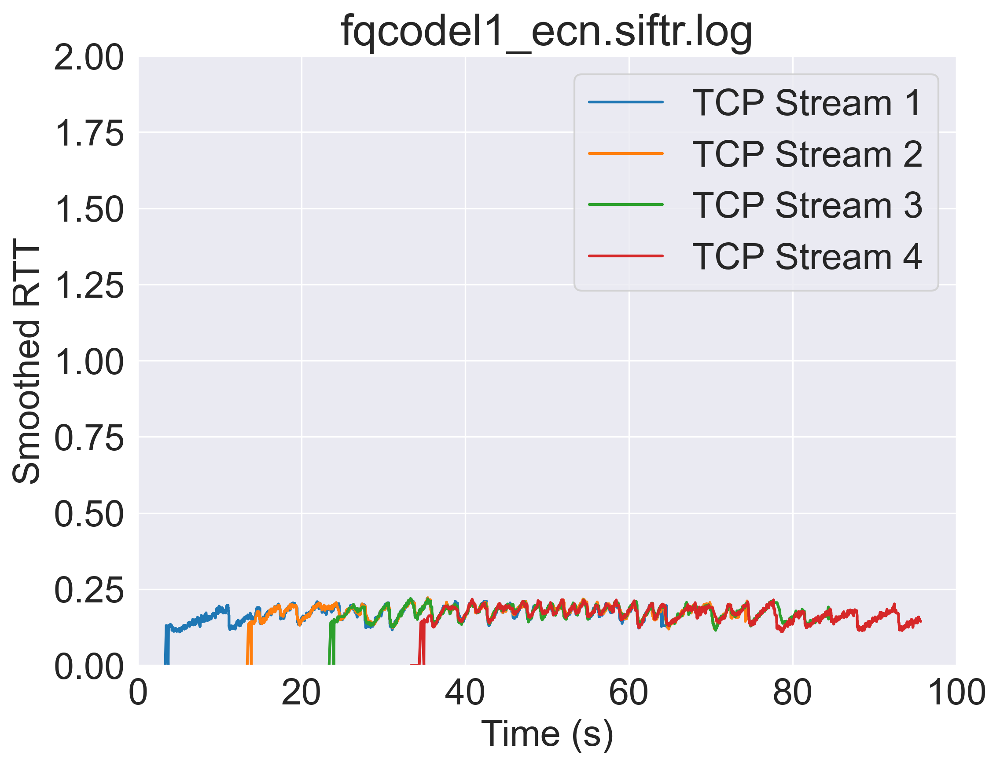

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


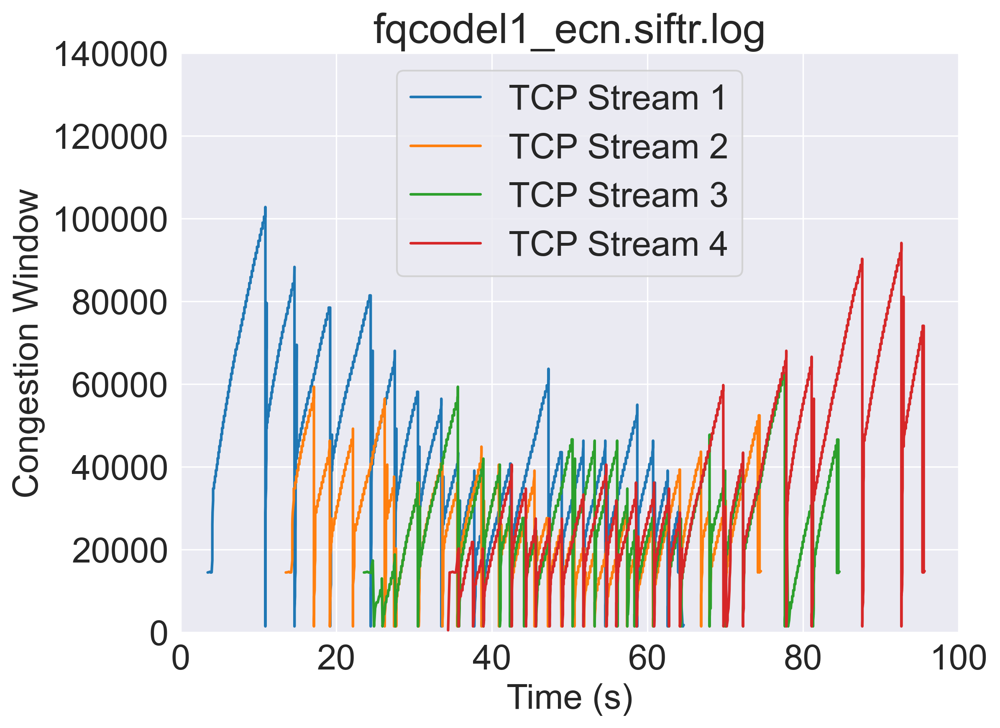

fqcodel1_noecn.siftr.log
count    9648.000000
mean        0.168808
std         0.024044
min         0.000000
25%         0.154375
50%         0.171875
75%         0.187812
max         0.220000
Name: SmoothedRTT, dtype: float64
17073    0.000000
17167    0.157188
17168    0.157188
17266    0.157812
17267    0.157812
Name: SmoothedRTT, dtype: float64
54378    0.158750
54379    0.158750
54442    0.152812
54444    0.152812
54445    0.152812
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


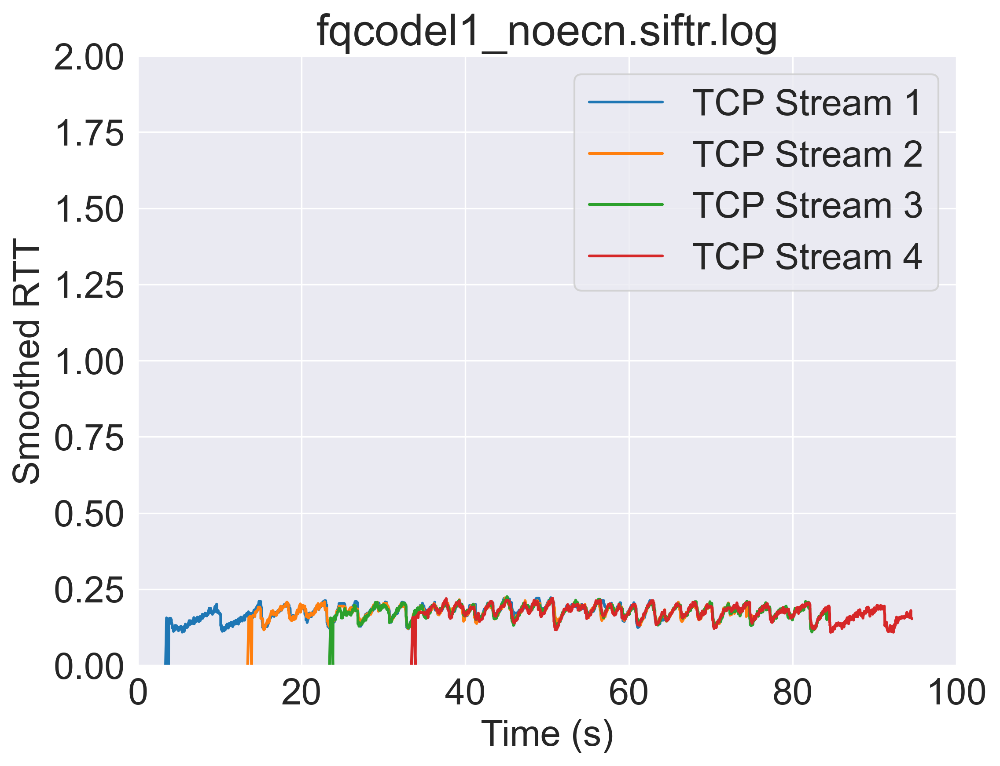

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


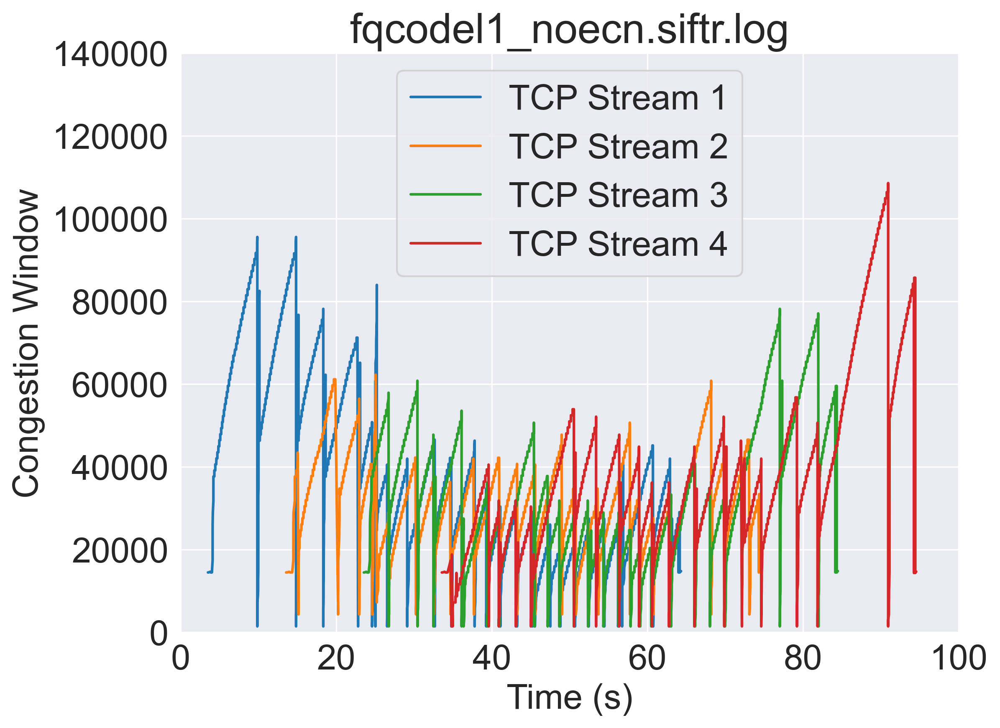

fqcodel2_ecn.siftr.log
count    792.000000
mean       0.926766
std        0.236158
min        0.000000
25%        0.731563
50%        0.870000
75%        1.138203
max        1.370000
Name: SmoothedRTT, dtype: float64
2122    0.000000
2185    0.817813
2186    0.817813
2253    0.840625
2254    0.840625
Name: SmoothedRTT, dtype: float64
6668    0.868125
6669    0.868125
6707    0.810937
6709    0.810937
6710    0.810937
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


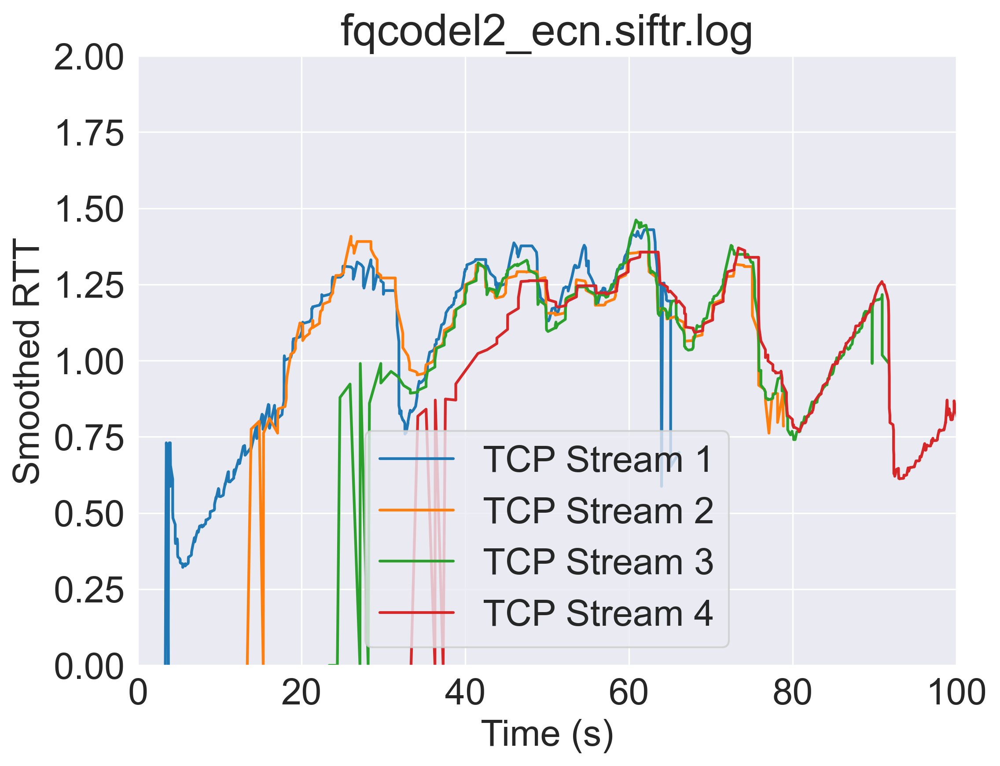

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


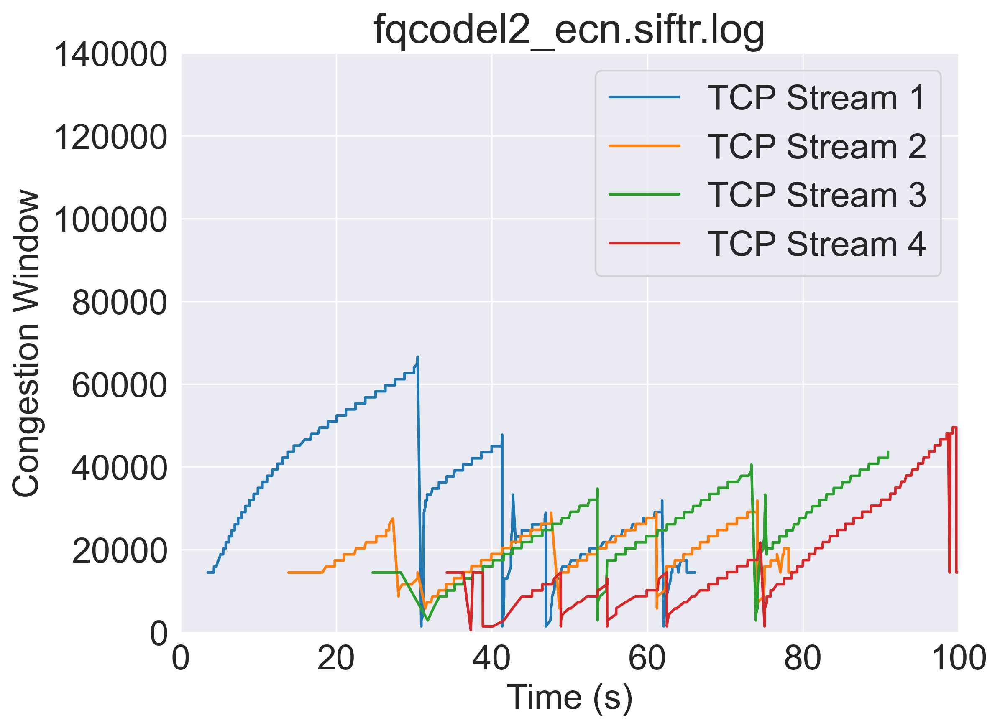

fqcodel2_noecn.siftr.log
count    1176.000000
mean        1.022502
std         0.155769
min         0.000000
25%         0.917109
50%         1.009375
75%         1.117812
max         1.370625
Name: SmoothedRTT, dtype: float64
2140    0.000000
2171    0.000000
2227    0.875625
2228    0.875625
2315    0.935000
Name: SmoothedRTT, dtype: float64
6866    1.008125
6867    1.008125
6915    0.944688
6917    0.944688
6918    0.944688
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


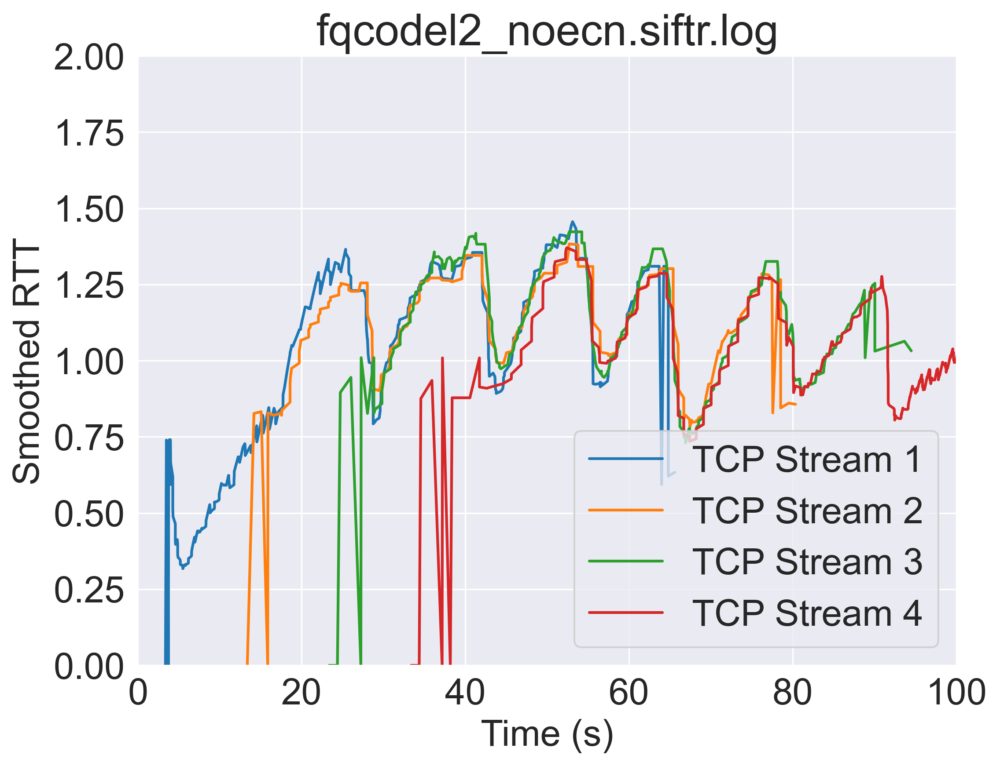

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


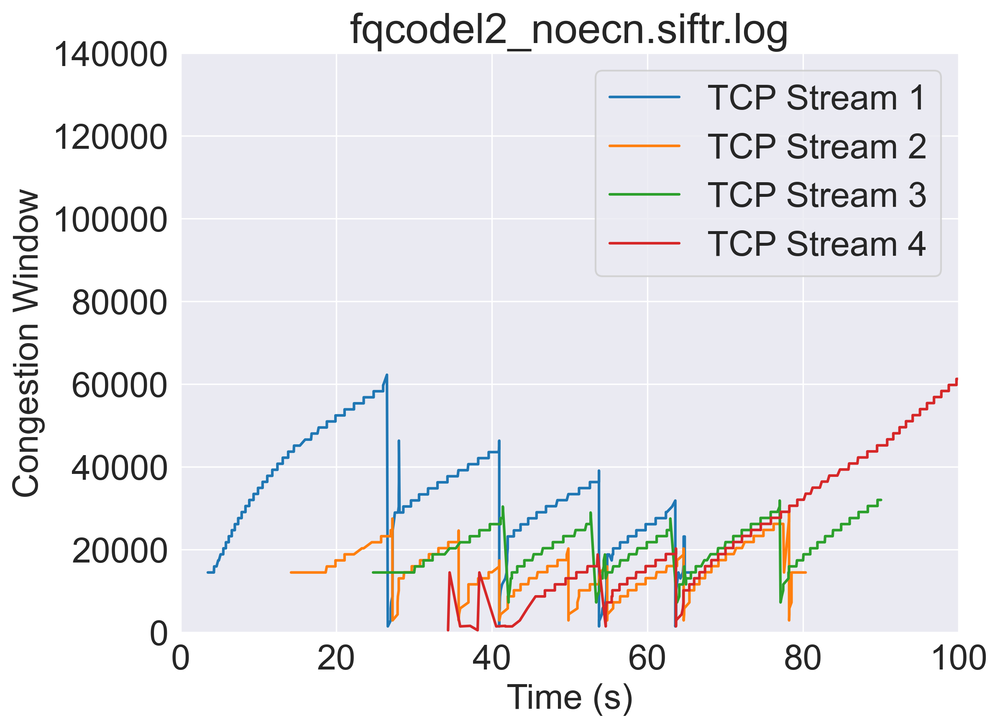

fqpie1_ecn.siftr.log
count    9214.000000
mean        0.167662
std         0.023693
min         0.000000
25%         0.150312
50%         0.170000
75%         0.185625
max         0.216562
Name: SmoothedRTT, dtype: float64
16948    0.000000
17059    0.149062
17060    0.149062
17145    0.146875
17146    0.146875
Name: SmoothedRTT, dtype: float64
53056    0.140625
53057    0.140625
53063    0.136875
53065    0.136875
53066    0.136875
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


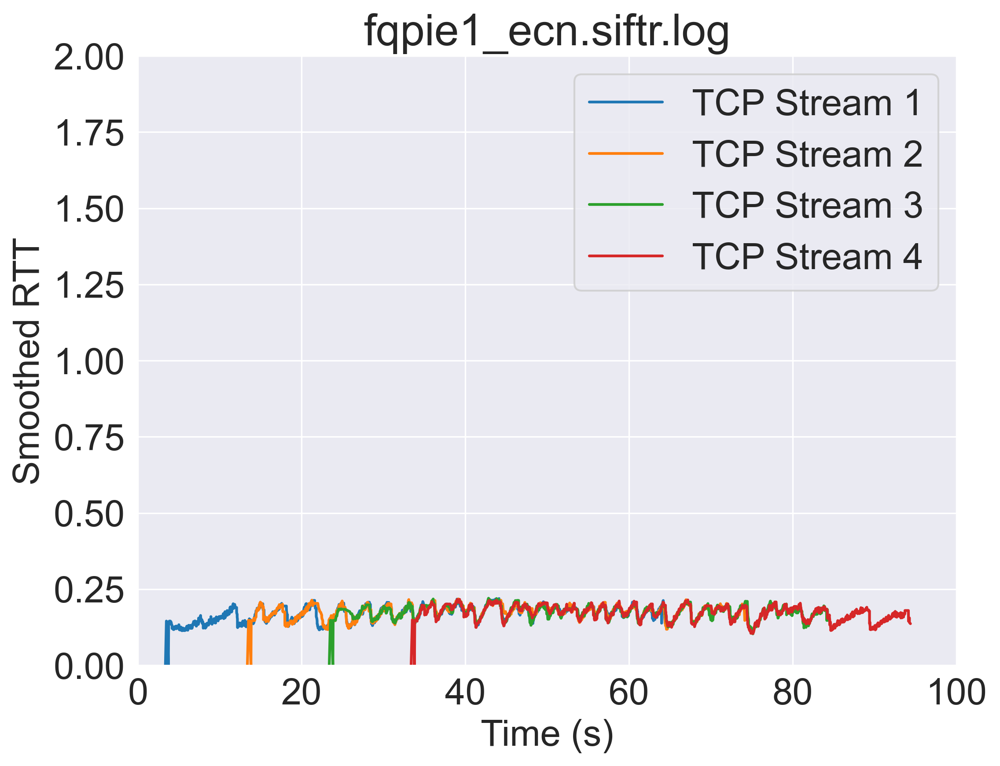

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


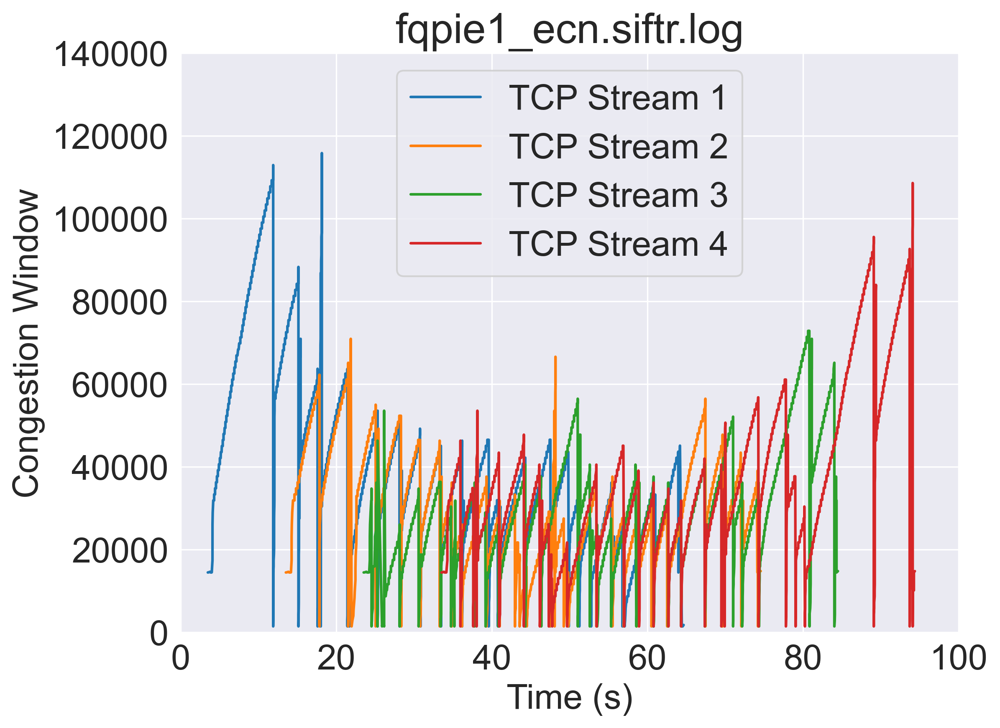

fqpie1_noecn.siftr.log
count    8817.000000
mean        0.162305
std         0.027496
min         0.000000
25%         0.139375
50%         0.165313
75%         0.184688
max         0.217812
Name: SmoothedRTT, dtype: float64
16216    0.000000
16338    0.159062
16345    0.159062
16469    0.158125
16470    0.158125
Name: SmoothedRTT, dtype: float64
52764    0.152812
52765    0.152812
52819    0.148750
52821    0.148750
52822    0.148750
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


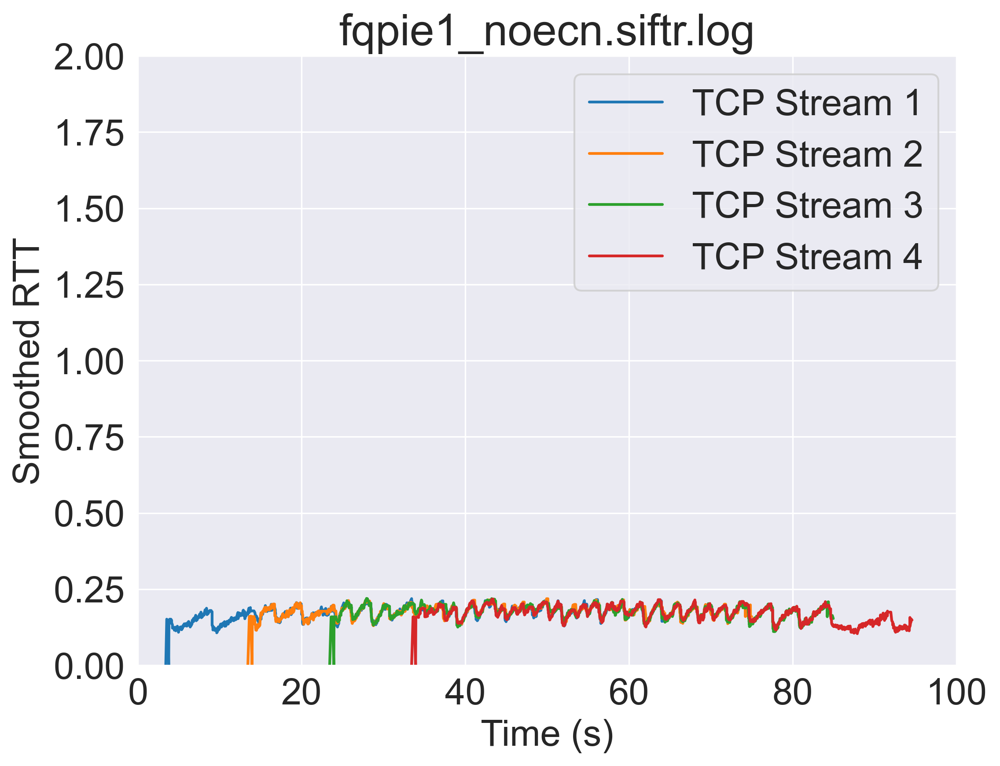

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


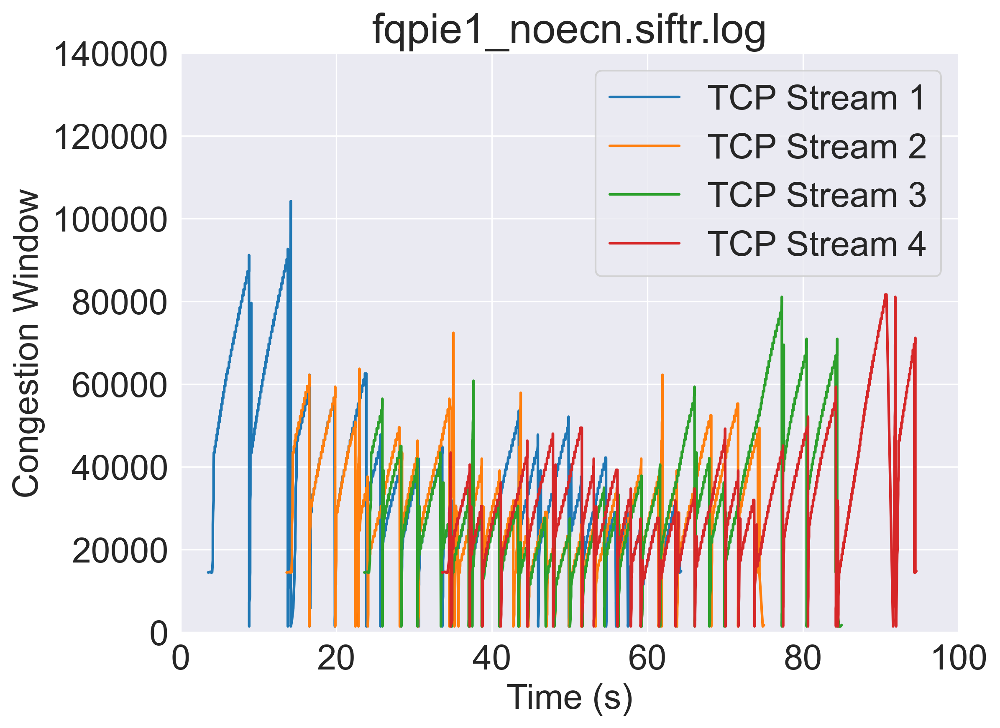

fqpie2_ecn.siftr.log
count    951.000000
mean       0.925100
std        0.258613
min        0.000000
25%        0.726406
50%        0.858437
75%        1.106562
max        1.514687
Name: SmoothedRTT, dtype: float64
2094    0.000000
2152    0.000000
2181    0.876563
2196    0.876563
2290    0.927188
Name: SmoothedRTT, dtype: float64
6759    0.975313
6760    0.975313
6799    0.909687
6801    0.909687
6802    0.909687
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


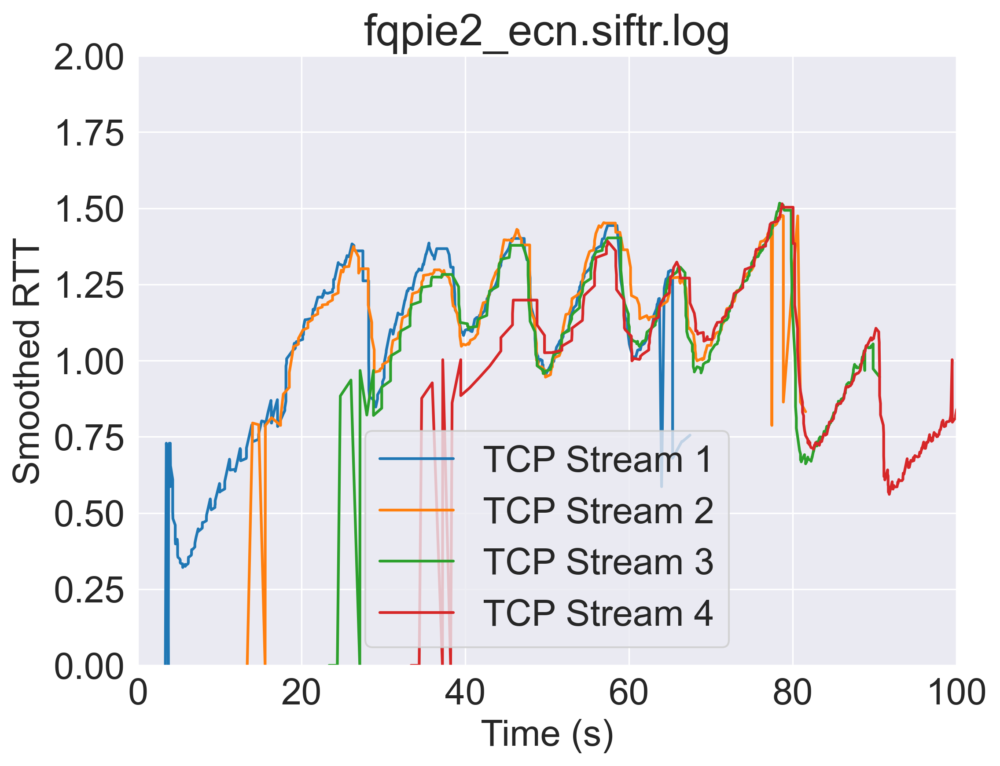

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


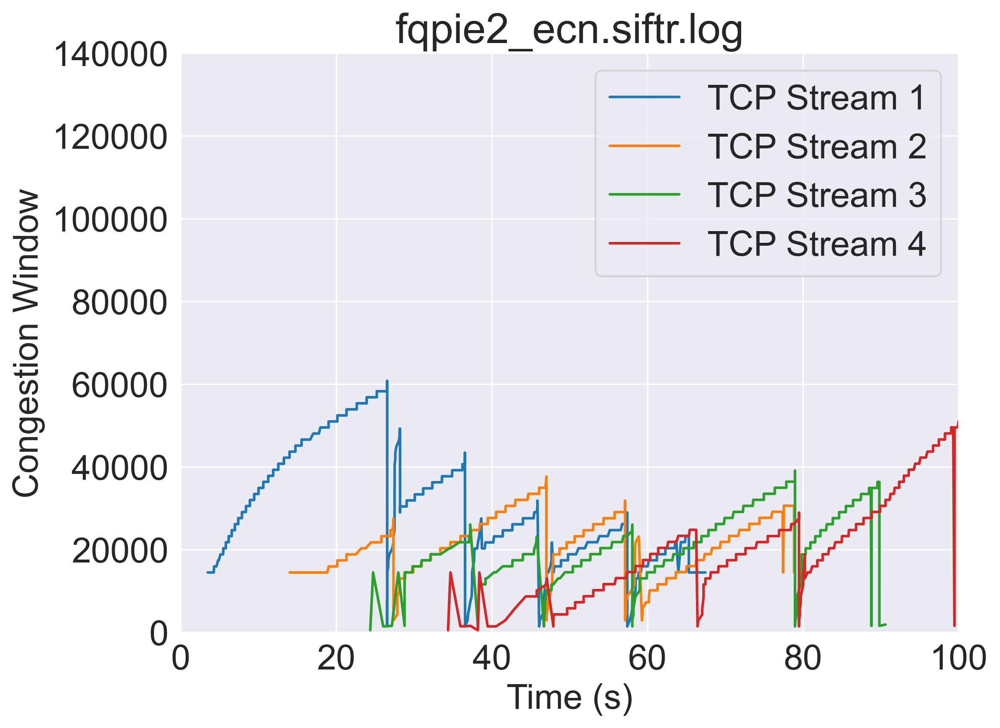

fqpie2_noecn.siftr.log
count    823.000000
mean       0.982866
std        0.256198
min        0.000000
25%        0.730625
50%        1.007500
75%        1.201094
max        1.412813
Name: SmoothedRTT, dtype: float64
2130    0.000000
2196    0.955000
2197    0.955000
2265    0.966875
2266    0.966875
Name: SmoothedRTT, dtype: float64
6732    0.971562
6733    0.971562
6769    0.895312
6771    0.895312
6772    0.895312
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


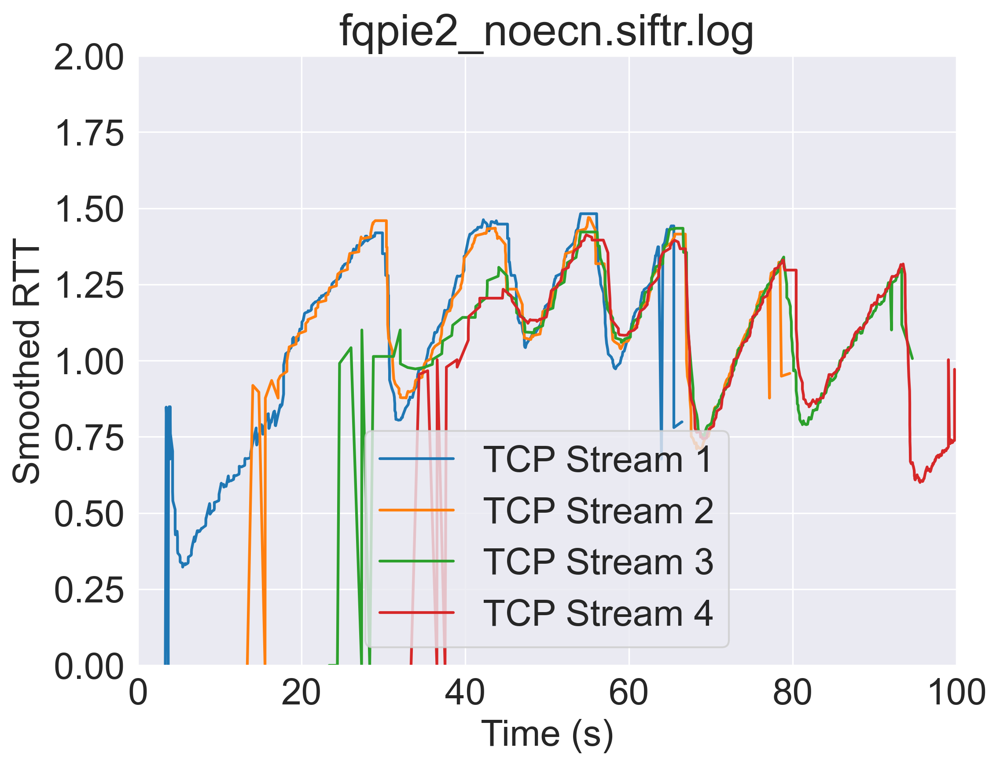

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


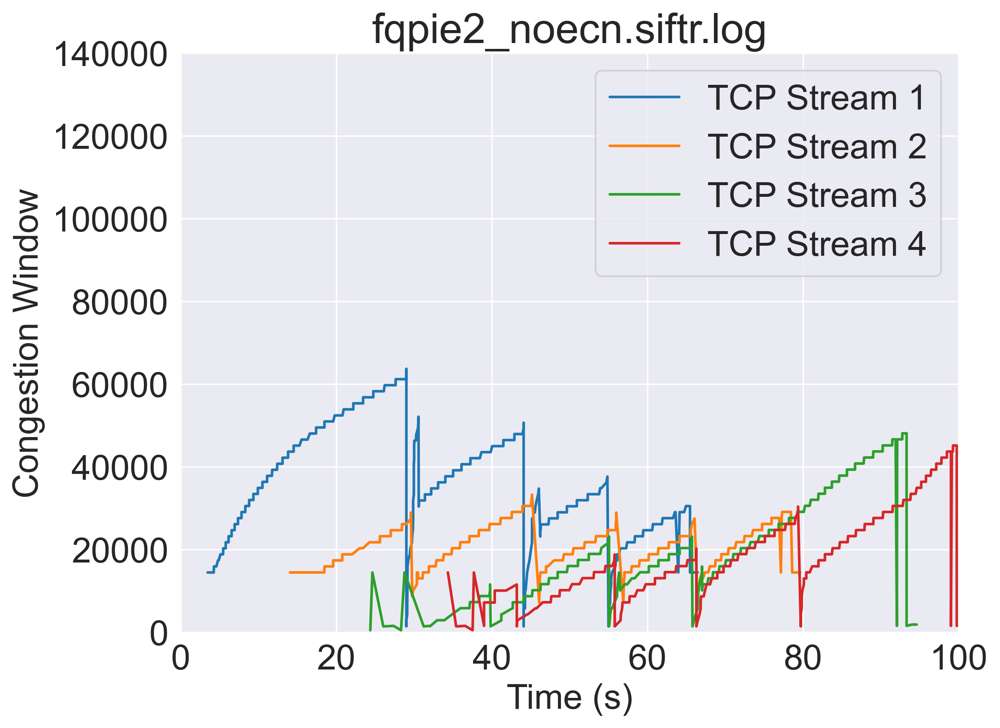

l4s1_ecn.siftr.log
count    10676.000000
mean         0.158937
std          0.039593
min          0.000000
25%          0.127109
50%          0.149531
75%          0.180000
max          0.368125
Name: SmoothedRTT, dtype: float64
15900    0.00000
16015    0.19125
16020    0.19125
16222    0.21125
16223    0.21125
Name: SmoothedRTT, dtype: float64
53143    0.188750
53200    0.180312
53211    0.180312
53212    0.180312
53229    0.171563
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


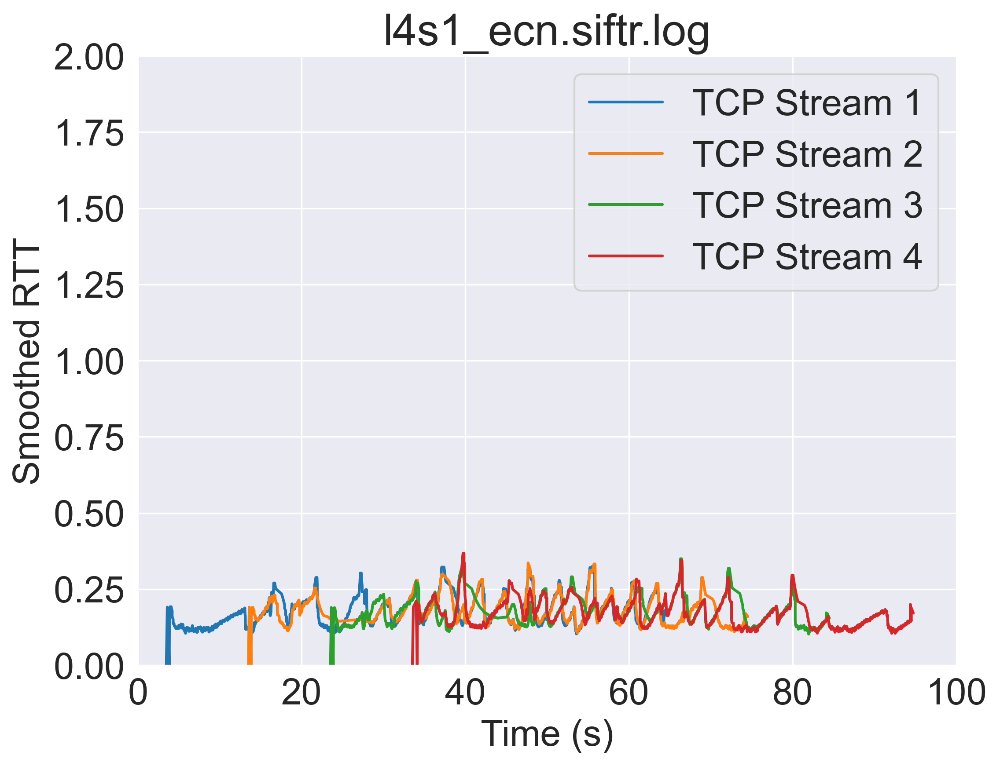

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


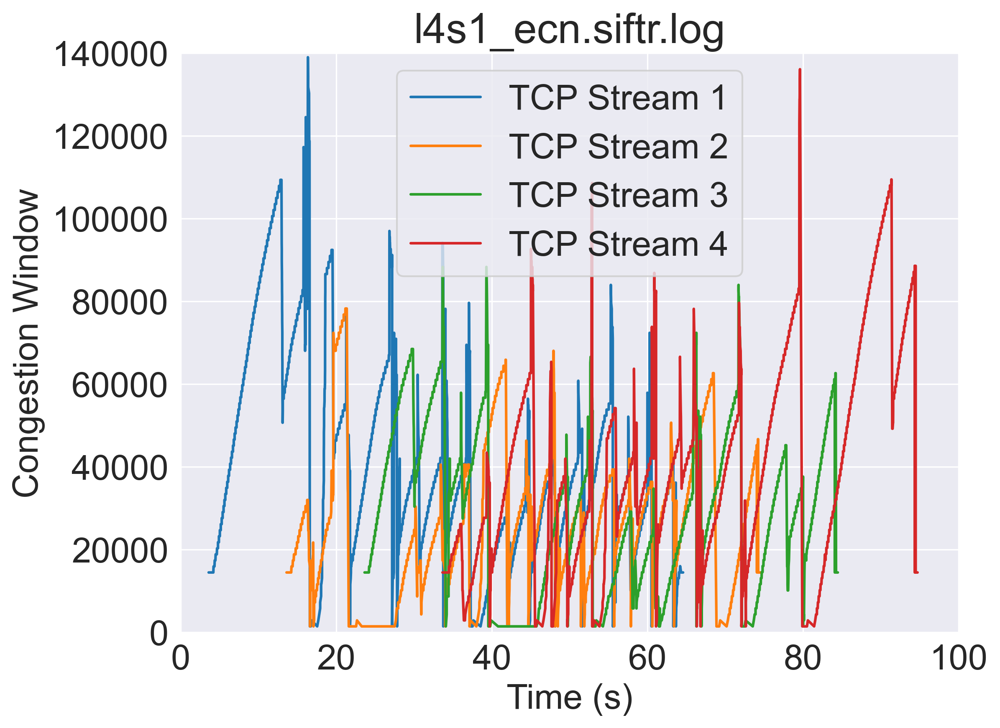

l4s1_noecn.siftr.log
count    11002.000000
mean         0.155488
std          0.034477
min          0.000000
25%          0.128438
50%          0.145937
75%          0.175625
max          0.268437
Name: SmoothedRTT, dtype: float64
17171    0.000000
17248    0.210313
17249    0.210313
17431    0.217812
17432    0.217812
Name: SmoothedRTT, dtype: float64
55737    0.184375
55740    0.184375
55741    0.184375
55742    0.184375
55757    0.176563
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


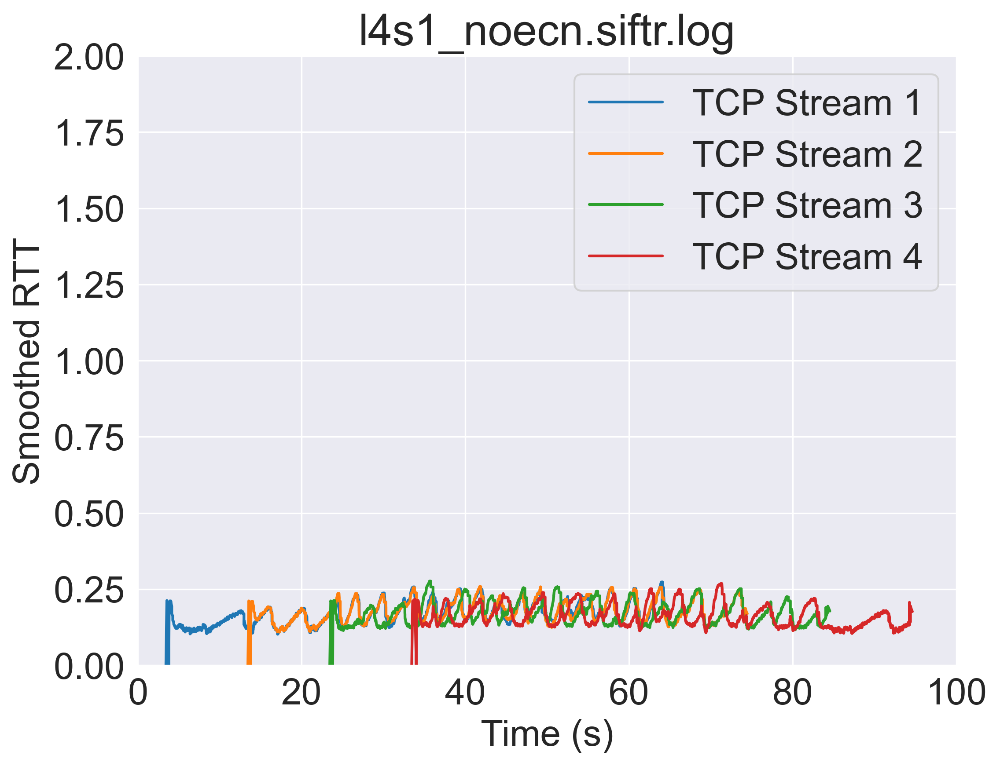

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


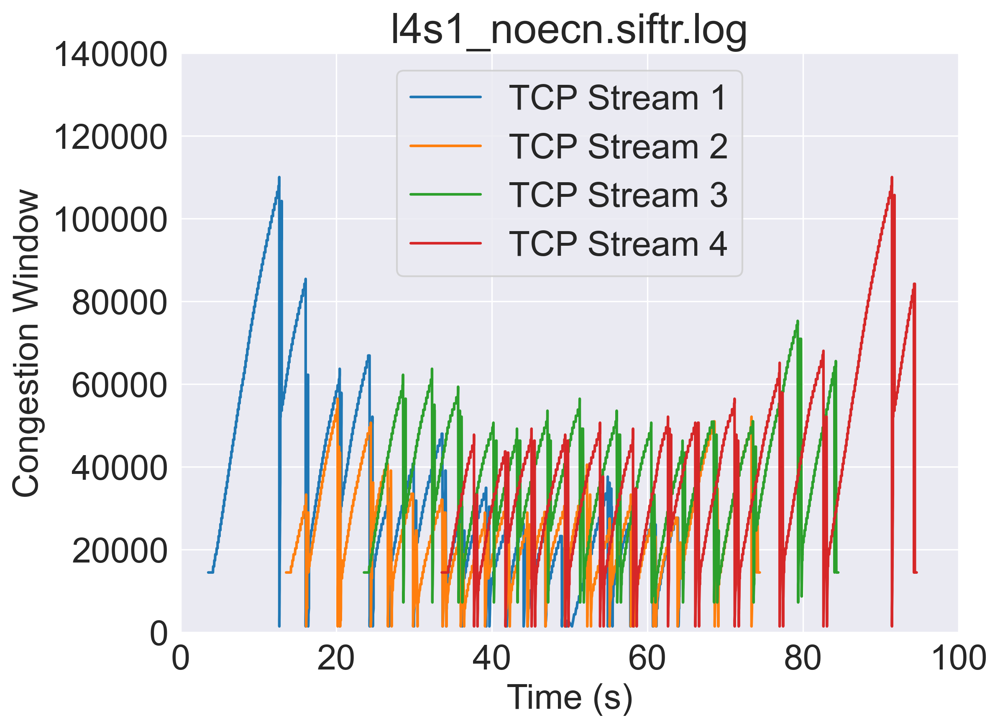

l4s2_ecn.siftr.log
count    1129.000000
mean        0.280163
std         0.057072
min         0.000000
25%         0.240313
50%         0.278750
75%         0.311875
max         0.425000
Name: SmoothedRTT, dtype: float64
2323    0.000000
2339    0.152812
2342    0.152812
2371    0.182500
2372    0.182500
Name: SmoothedRTT, dtype: float64
6912    0.171563
6913    0.171563
6925    0.169063
6927    0.169063
6928    0.169063
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


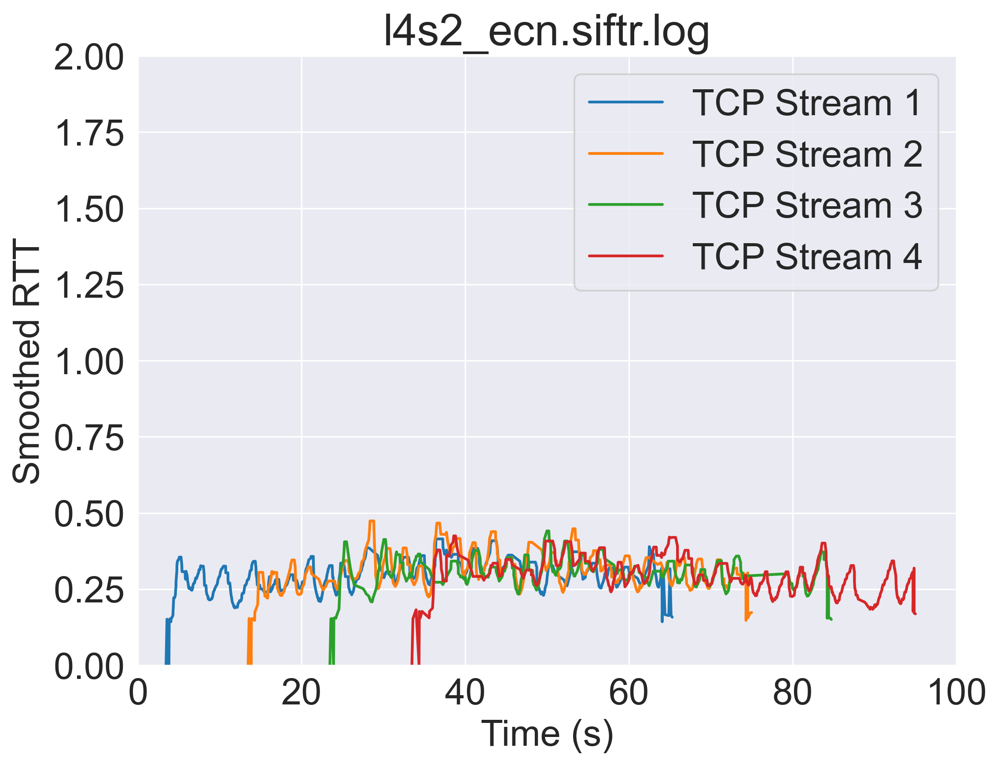

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


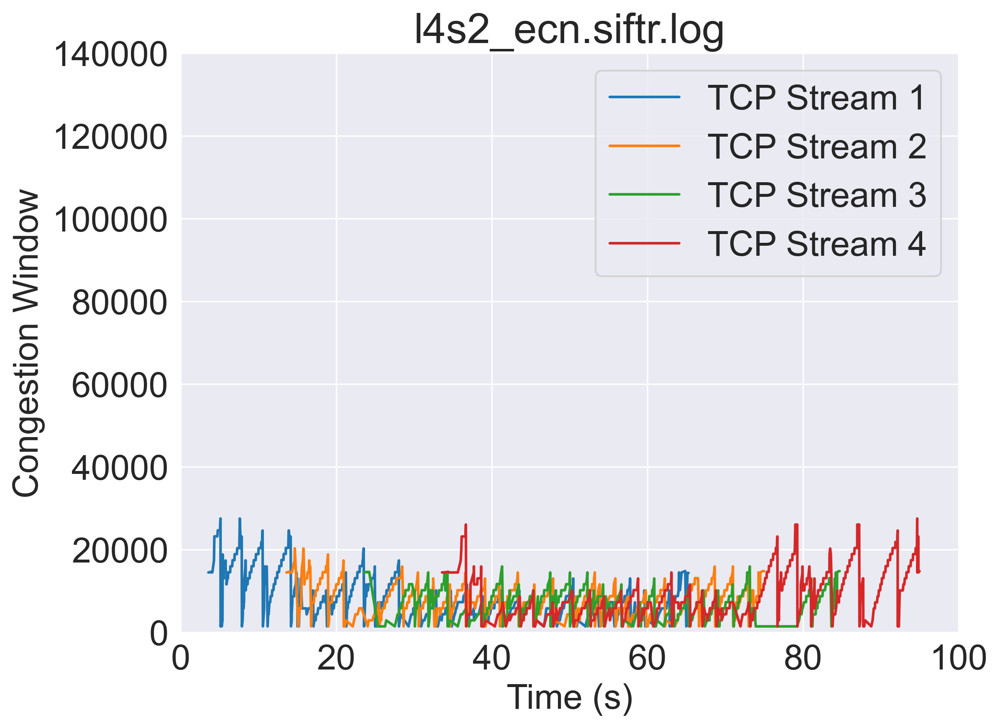

l4s2_noecn.siftr.log
count    1239.000000
mean        0.295424
std         0.065784
min         0.000000
25%         0.244375
50%         0.292500
75%         0.333750
max         0.556875
Name: SmoothedRTT, dtype: float64
2262    0.000000
2277    0.160625
2278    0.160625
2304    0.180625
2305    0.180625
Name: SmoothedRTT, dtype: float64
7070    0.286875
7080    0.186562
7083    0.186562
7084    0.186562
7099    0.178437
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


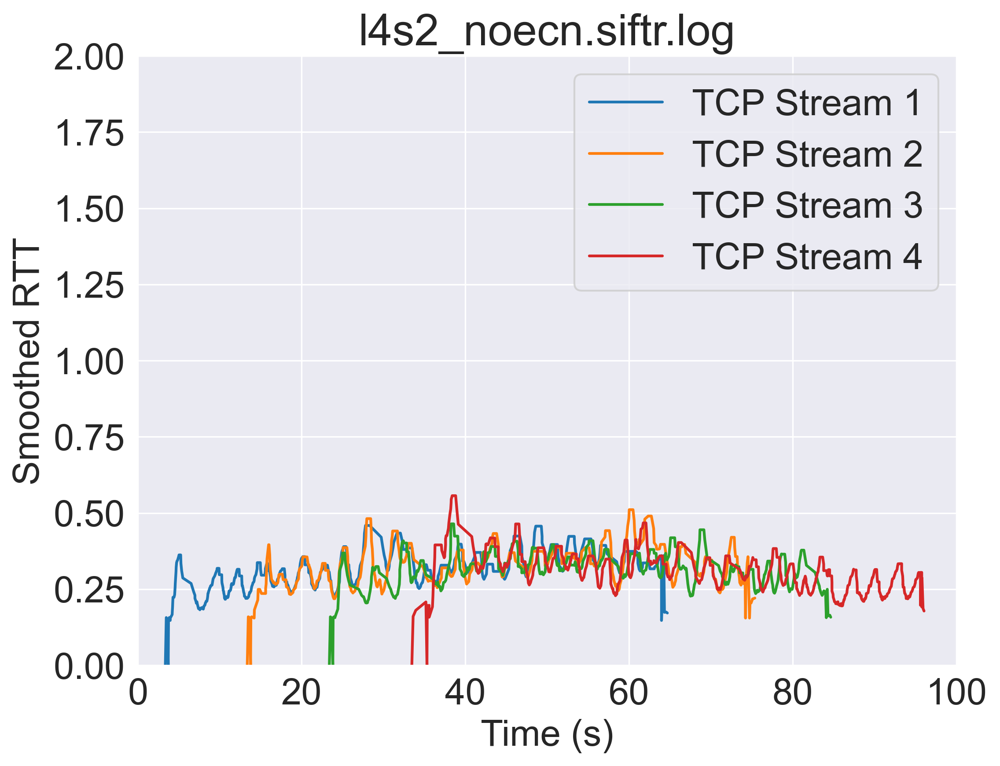

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


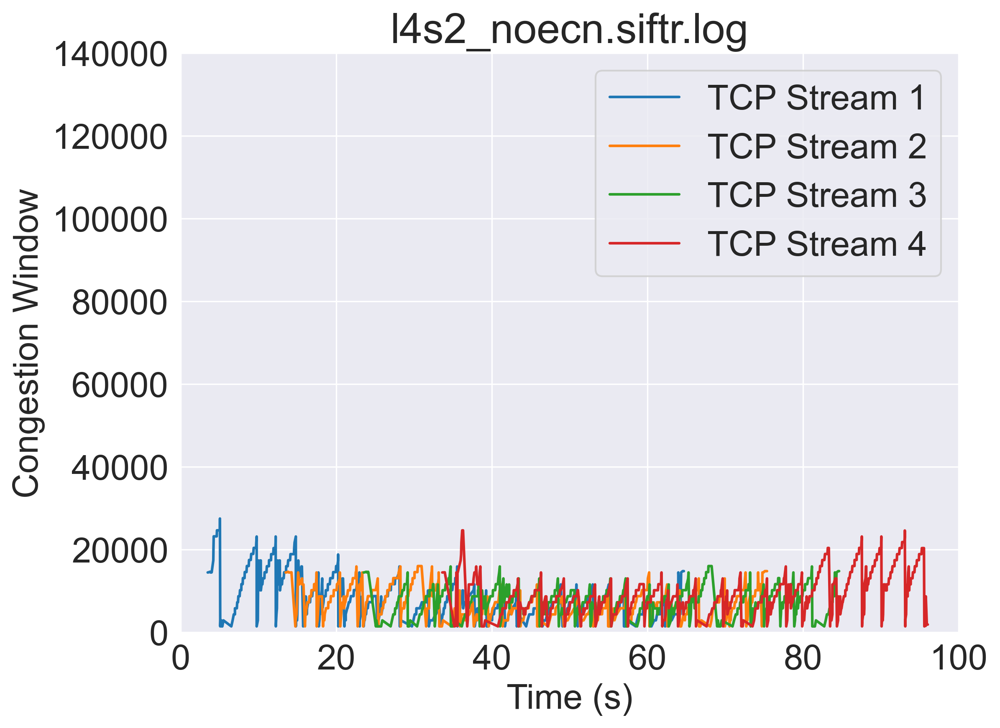

pie1_ecn.siftr.log
count    6302.000000
mean        0.147006
std         0.023601
min         0.000000
25%         0.126875
50%         0.144687
75%         0.161875
max         0.207813
Name: SmoothedRTT, dtype: float64
14540    0.000000
14612    0.143437
14616    0.143437
14691    0.143125
14692    0.143125
Name: SmoothedRTT, dtype: float64
44393    0.14125
44394    0.14125
44422    0.13875
44424    0.13875
44425    0.13875
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


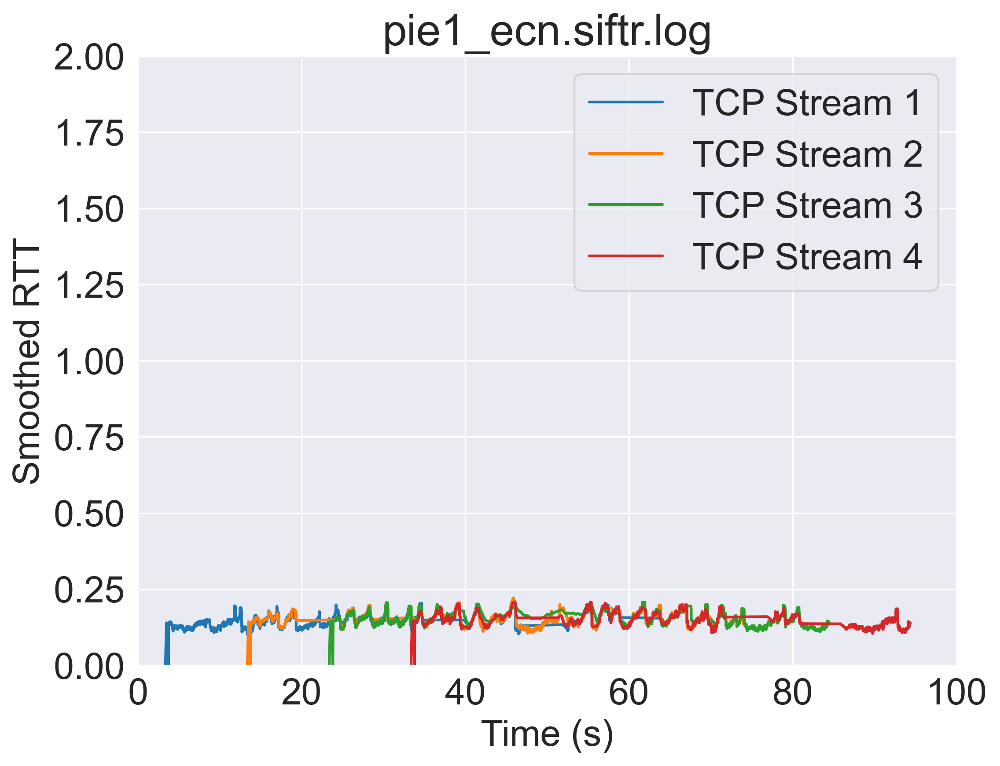

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


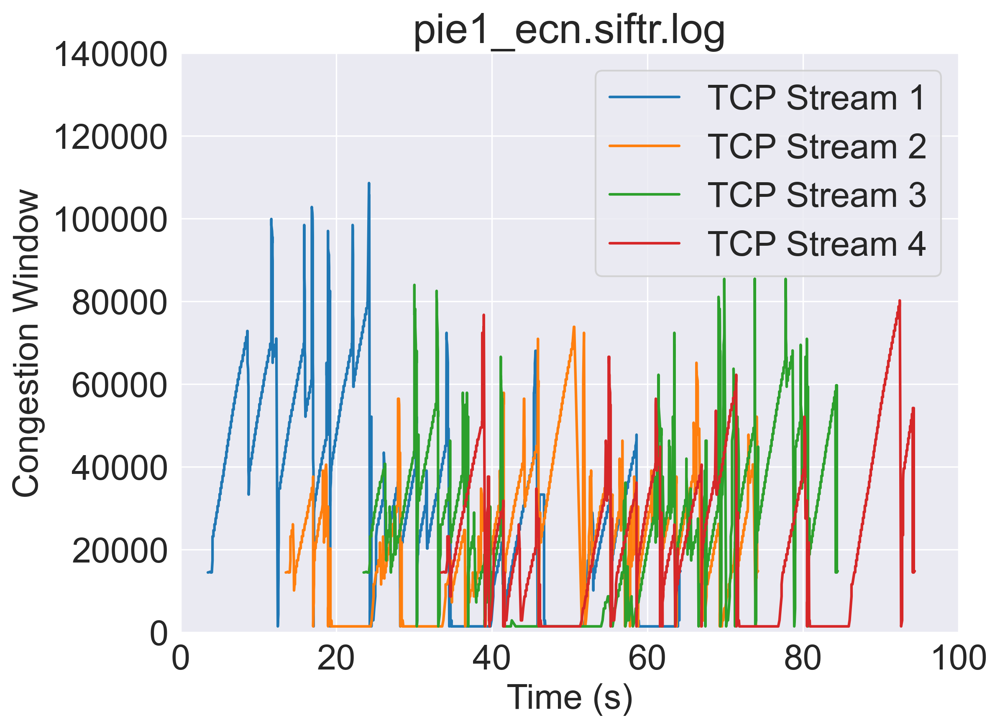

pie1_noecn.siftr.log
count    8668.000000
mean        0.164148
std         0.024953
min         0.000000
25%         0.145313
50%         0.166250
75%         0.183750
max         0.222188
Name: SmoothedRTT, dtype: float64
16491    0.000000
16619    0.159688
16638    0.159688
16776    0.166250
16777    0.166250
Name: SmoothedRTT, dtype: float64
52673    0.171875
52674    0.171875
52736    0.169375
52738    0.169375
52739    0.169375
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


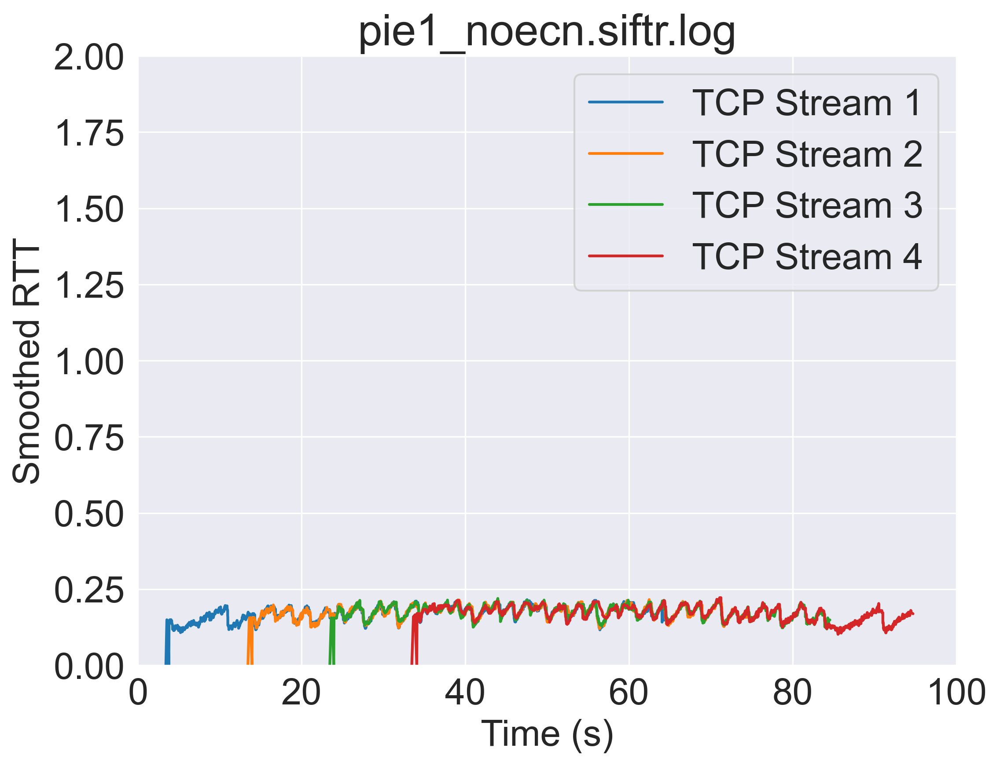

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


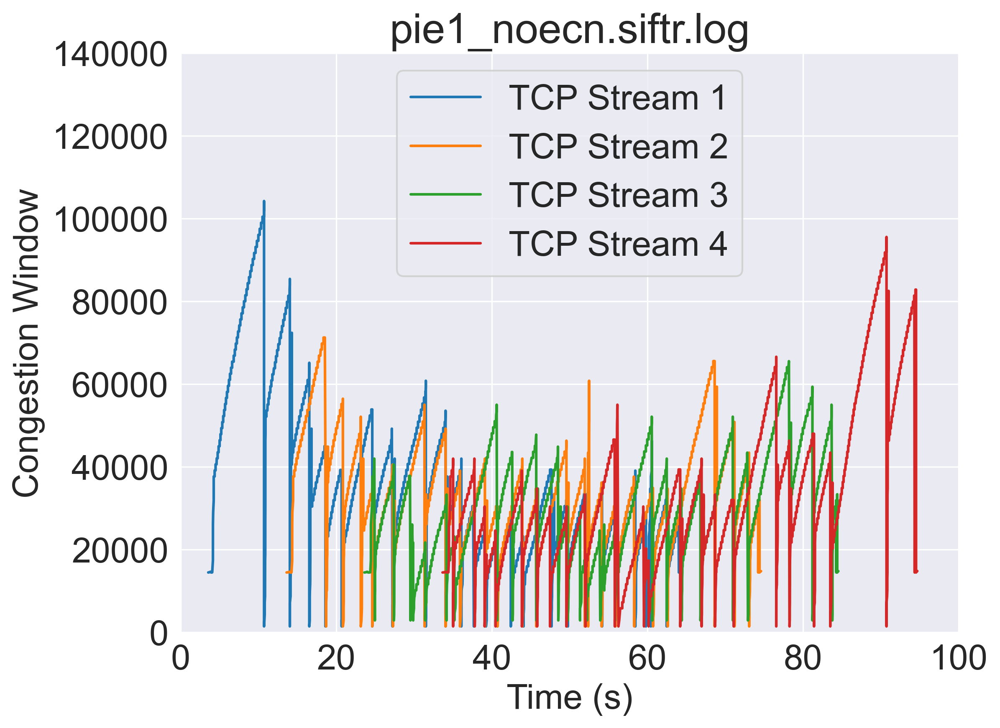

pie2_ecn.siftr.log
count    1055.000000
mean        0.947115
std         0.256026
min         0.000000
25%         0.736250
50%         0.850938
75%         1.138750
max         1.458438
Name: SmoothedRTT, dtype: float64
2106    0.000000
2176    0.000000
2178    0.653750
2179    0.653750
2273    0.729688
Name: SmoothedRTT, dtype: float64
6744    0.858437
6745    0.858437
6784    0.828750
6786    0.828750
6787    0.828750
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


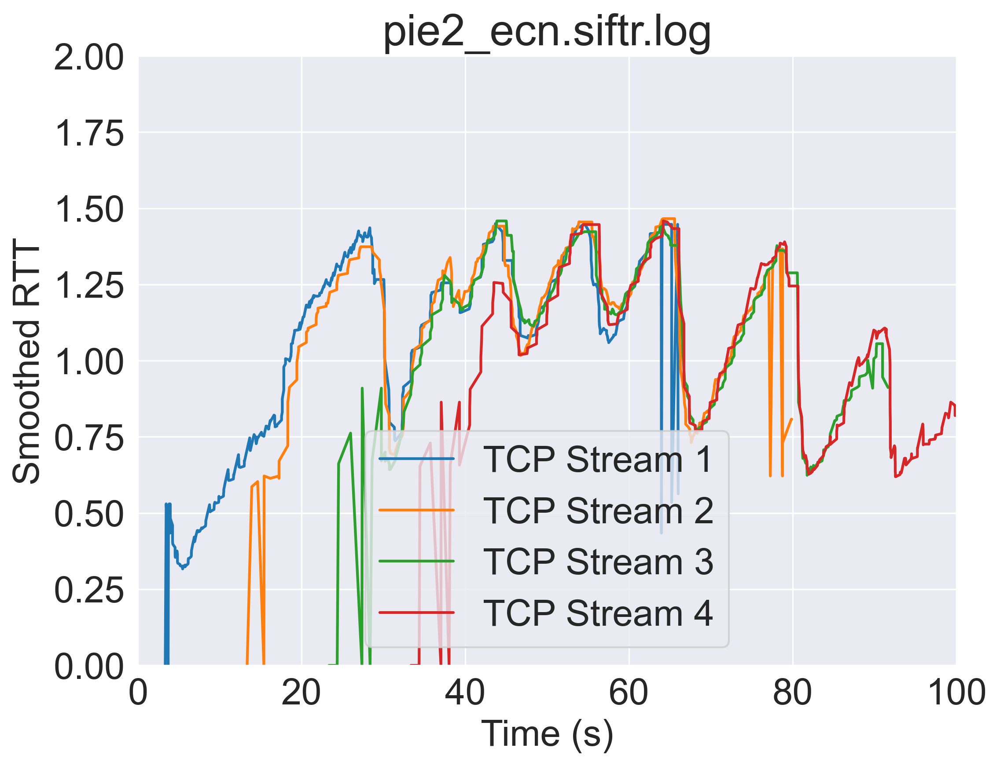

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


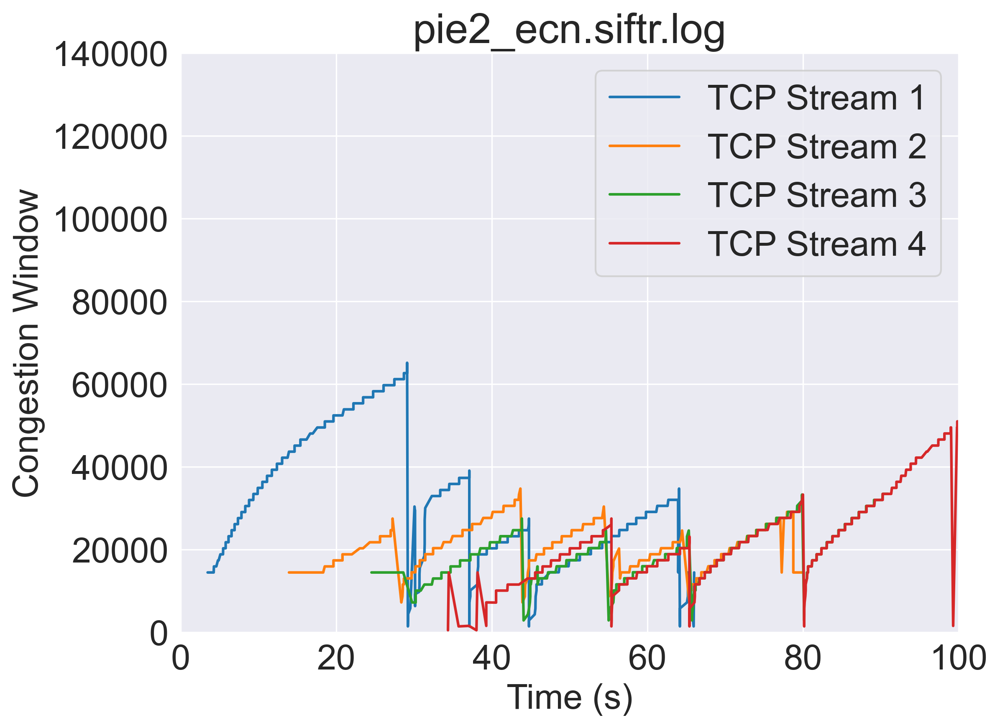

pie2_noecn.siftr.log
count    838.000000
mean       0.979552
std        0.253998
min        0.000000
25%        0.721875
50%        1.021875
75%        1.201875
max        1.401875
Name: SmoothedRTT, dtype: float64
2129    0.000000
2193    0.884687
2196    0.884687
2262    0.903125
2263    0.903125
Name: SmoothedRTT, dtype: float64
6676    0.900625
6677    0.900625
6714    0.854375
6716    0.854375
6717    0.854375
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


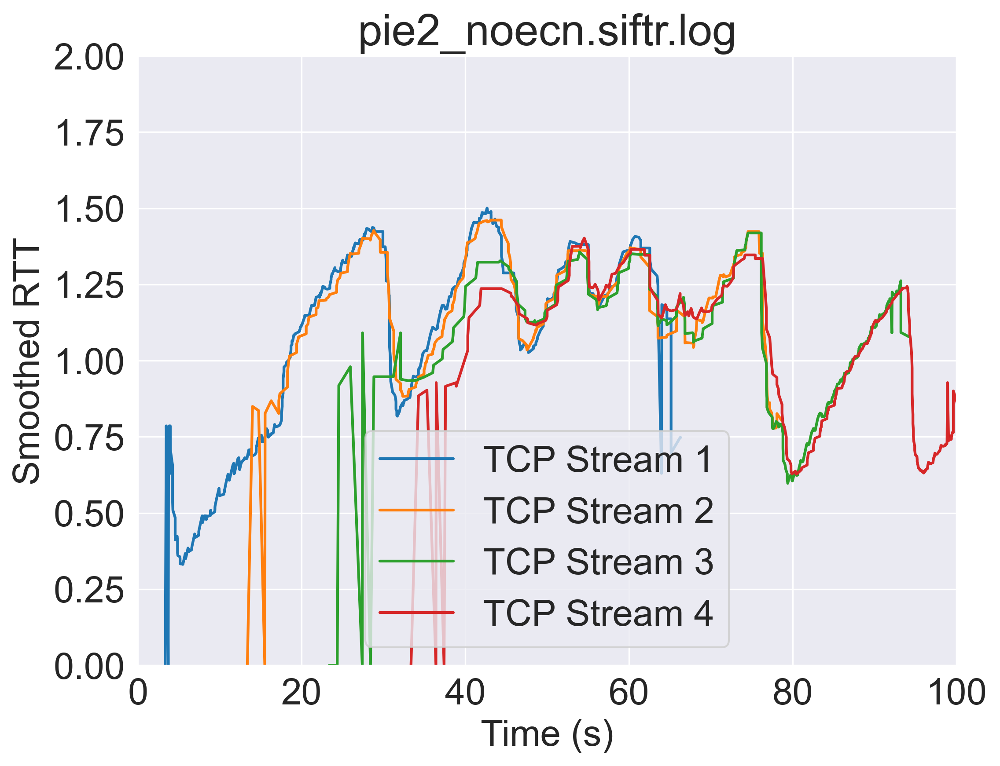

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


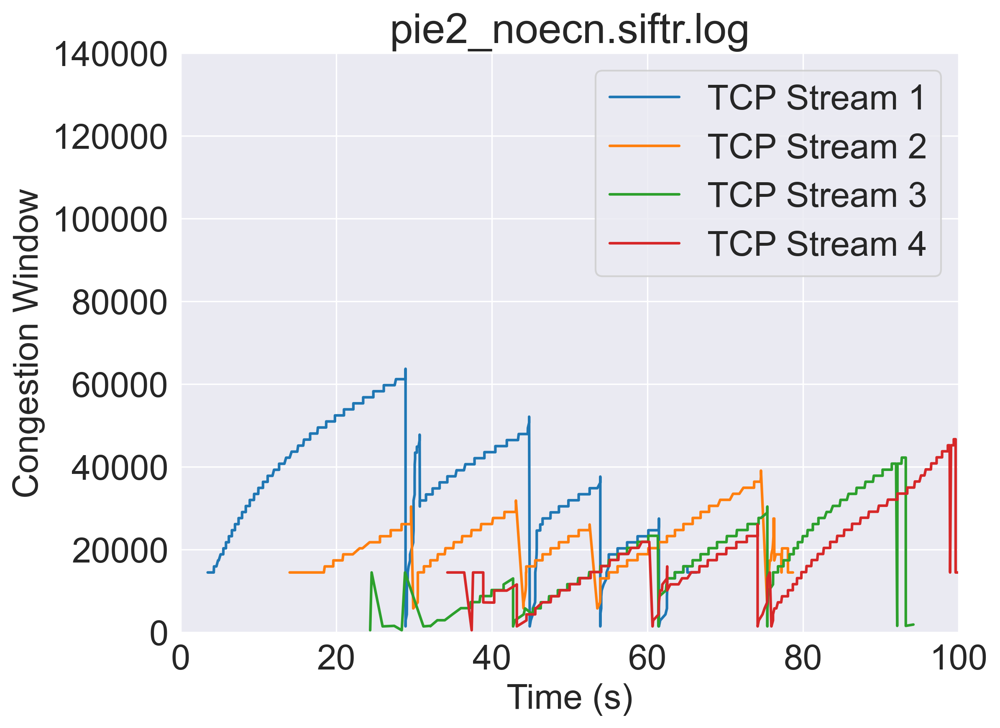

In [31]:
dataframe_list=[]
data_filename_list=[]
data_dict={}
for index in range(len(filenames)):
    # open d:/work/mptcp/twopathMPdata/test1/twopathtype1.siftr.log
    data = []
    with open("./datatest1/"+filenames[index], 'r') as f:
        # store the data
        for line in f:
            tem = re.sub(r'\s', '', line)
            data.append(tem.split(','))
    # remove file line of data
    print(filenames[index])
    data.pop(0)
    data.pop(len(data)-1)

    # define variables from enable_time_secs=1716792031	enable_time_usecs=061770	
    # siftrver=1.2.4 hz=100	tcp_rtt_scale=32	sysname=FreeBSD	sysver=1301000	ipmode=4
    enable_time_secs = 1716792031
    enable_time_usecs = 61770
    siftver = '1.2.4'
    hz = 100
    tcp_rtt_scale = 32
    sysname = 'FreeBSD'
    sysver = 1301000
    ipmode = 4



    df = pd.DataFrame(data, columns=col)

    df=df[df['Direction']=='o']

    # congestion window to int
    df = df.astype({'CongestionWindow': 'int32'})
    
    # Convert 'Time' column to float64 type
    df['Time'] = df['Time'].astype('float64')

    # Subtract the first time entry from all the entries in 'Time' column
    df['Time'] = df['Time'] - df['Time'].iloc[0]



    # remove rows that congestion window bigger than 70000
    # df = df[df['CongestionWindow'].astype(int) < 70000]
    # RTT divide by tcp_rtt_scale * hz
    df['SmoothedRTT'] = df['SmoothedRTT'].astype('float64')
    df['SmoothedRTT'] = df['SmoothedRTT'] / (tcp_rtt_scale * hz)
    df['SmoothedRTT'] = df['SmoothedRTT'].astype('float64')

    



    # first path ForeignPort = 5101
    dfPath1 = df.loc[(df['ForeignPort'] == '5101')]

    # second path localip = 5102
    dfPath2 = df.loc[(df['ForeignPort'] == '5102')]

    # third path ForeignPort = 5101
    dfPath3 = df.loc[(df['ForeignPort'] == '5103' )]

    # fourth path localip = 5102
    dfPath4 = df.loc[(df['ForeignPort'] == '5104')]
    
    # data_filename_list.append(filenames[index])
    # dataframe_list.append(dfPath1.copy())
    # data_dict[filenames[index]]=dfPath1.copy()
    print(dfPath4['SmoothedRTT'].describe())
    print(dfPath4['SmoothedRTT'].head(5))
    print(dfPath4['SmoothedRTT'].tail(5))

    # Darker color-blind-friendly palette
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
    # Different line styles and markers
    line_styles = ['-', '--', '-.', ':']
    #line_styles = ['-', '-', '-', '-']
    markers = ['o', 's', '^', 'D']

    


    

    # Plot Smoothed RTT vs Time
    #plt.figure(figsize=(7, 4.5))  # Set the figure size to fit within the column width
    plt.rcParams.update({'figure.figsize':(8,6), 'figure.dpi':300, 'font.size':20})
    sns.set_style("darkgrid")  # Set the style to darkgrid

    if contains_1_or_2(filenames[index]) == 1:
        plt.xlim(0,100)
        plt.ylim(0,2)
    elif contains_1_or_2(filenames[index]) == 2:
        plt.xlim(0,100)
        plt.ylim(0,2)
    
    # plt.plot(dfPath1['Time'], dfPath1['SmoothedRTT'], label='TCP Stream 1',
    #              color=colors[0], linestyle=line_styles[0])
    # plt.plot(dfPath2['Time'], dfPath2['SmoothedRTT'], label='TCP Stream 2',
    #              color=colors[1], linestyle=line_styles[1])
    # plt.plot(dfPath3['Time'], dfPath3['SmoothedRTT'], label='TCP Stream 3',
    #              color=colors[2], linestyle=line_styles[2])
    # plt.plot(dfPath4['Time'], dfPath4['SmoothedRTT'], label='TCP Stream 4',
    #              color=colors[3], linestyle=line_styles[3])
    
    plt.plot(dfPath1['Time'], dfPath1['SmoothedRTT'], label='TCP Stream 1',
                 color=colors[0])
    plt.plot(dfPath2['Time'], dfPath2['SmoothedRTT'], label='TCP Stream 2',
                 color=colors[1])
    plt.plot(dfPath3['Time'], dfPath3['SmoothedRTT'], label='TCP Stream 3',
                 color=colors[2])
    plt.plot(dfPath4['Time'], dfPath4['SmoothedRTT'], label='TCP Stream 4',
                 color=colors[3])
    
    plt.xlabel('Time (s)')
    plt.ylabel('Smoothed RTT')
    plt.title(filenames[index])
    plt.legend()
    plt.grid(True)
    # plt.savefig("./iperf3_tests/"+title+"-"+"Graphs.png", dpi=100,bbox_inches='tight')
    plt.savefig("./Graphs/"+filenames[index]+"_SmoothedRTT.png", dpi=300,bbox_inches='tight')
    plt.savefig("./Graphs/"+filenames[index]+"_SmoothedRTT.eps", dpi=300,bbox_inches='tight')
    plt.show()

    dfpath1_filtered = remove_outliers_iqr(dfPath1,"CongestionWindow")
    dfpath2_filtered = remove_outliers_iqr(dfPath2,"CongestionWindow")
    dfpath3_filtered = remove_outliers_iqr(dfPath3,"CongestionWindow")
    dfpath4_filtered = remove_outliers_iqr(dfPath4,"CongestionWindow")

    # Plot CWND vs Time
    #plt.figure(figsize=(7, 4.5))  # Set the figure size to fit within the column width
    plt.rcParams.update({'figure.figsize':(8,6), 'figure.dpi':300, 'font.size':20})
    sns.set_style("darkgrid")  # Set the style to darkgrid


    if contains_1_or_2(filenames[index]) == 1:
        plt.xlim(0,100)
        plt.ylim(0,140000)
    elif contains_1_or_2(filenames[index]) == 2:
        plt.xlim(0,100)
        plt.ylim(0,140000)
    

    
   
    # plt.plot(dfpath1_filtered['Time'], dfpath1_filtered['CongestionWindow'], label='TCP Stream 1',
    #              color=colors[0], linestyle=line_styles[0])
    # plt.plot(dfpath2_filtered['Time'], dfpath2_filtered['CongestionWindow'], label='TCP Stream 2',
    #              color=colors[1], linestyle=line_styles[1])
    # plt.plot(dfpath3_filtered['Time'], dfpath3_filtered['CongestionWindow'], label='TCP Stream 3',
    #              color=colors[2], linestyle=line_styles[2])
    # plt.plot(dfpath4_filtered['Time'], dfpath4_filtered['CongestionWindow'], label='TCP Stream 4',
    #              color=colors[3], linestyle=line_styles[3])
    

    plt.plot(dfpath1_filtered['Time'], dfpath1_filtered['CongestionWindow'], label='TCP Stream 1',
                 color=colors[0])
    plt.plot(dfpath2_filtered['Time'], dfpath2_filtered['CongestionWindow'], label='TCP Stream 2',
                 color=colors[1])
    plt.plot(dfpath3_filtered['Time'], dfpath3_filtered['CongestionWindow'], label='TCP Stream 3',
                 color=colors[2])
    plt.plot(dfpath4_filtered['Time'], dfpath4_filtered['CongestionWindow'], label='TCP Stream 4',
                 color=colors[3])
    
    plt.xlabel('Time (s)')
    plt.ylabel('Congestion Window')
    plt.title(filenames[index])
    plt.legend()
    plt.grid(True)
    # plt.savefig("./iperf3_tests/"+title+"-"+"Graphs.png", dpi=100,bbox_inches='tight')
    plt.savefig("./Graphs/"+filenames[index]+"_CWND.png", dpi=300,bbox_inches='tight')
    plt.savefig("./Graphs/"+filenames[index]+"_CWND.eps", dpi=300,bbox_inches='tight')
    plt.show()
    


In [32]:
# dataframe_list=[]
# data_filename_list=[]
# data_dict={}
# for index in range(len(filenames)):
#     # open d:/work/mptcp/twopathMPdata/test1/twopathtype1.siftr.log
#     data = []
#     with open("./datatest1/"+filenames[index], 'r') as f:
#         # store the data
#         for line in f:
#             tem = re.sub(r'\s', '', line)
#             data.append(tem.split(','))
#     # remove file line of data
#     data.pop(0)
#     data.pop(len(data)-1)

#     # define variables from enable_time_secs=1716792031	enable_time_usecs=061770	
#     # siftrver=1.2.4 hz=100	tcp_rtt_scale=32	sysname=FreeBSD	sysver=1301000	ipmode=4
#     enable_time_secs = 1716792031
#     enable_time_usecs = 61770
#     siftver = '1.2.4'
#     hz = 100
#     tcp_rtt_scale = 32
#     sysname = 'FreeBSD'
#     sysver = 1301000
#     ipmode = 4



#     df = pd.DataFrame(data, columns=col)

#     # congestion window to int
#     df = df.astype({'CongestionWindow': 'int32'})
    
#     # Convert 'Time' column to float64 type
#     df['Time'] = df['Time'].astype('float64')

#     # Subtract the first time entry from all the entries in 'Time' column
#     df['Time'] = df['Time'] - df['Time'].iloc[0]



#     # remove rows that congestion window bigger than 70000
#     # df = df[df['CongestionWindow'].astype(int) < 70000]
#     # RTT divide by tcp_rtt_scale * hz
#     df['SmoothedRTT'] = df['SmoothedRTT'].astype('float64')
#     df['SmoothedRTT'] = df['SmoothedRTT'] / (tcp_rtt_scale * hz)
#     df['SmoothedRTT'] = df['SmoothedRTT'].astype('float64')



#     # first path ForeignPort = 5101
#     dfPath1 = df.loc[(df['ForeignPort'] == '5101')]

#     # second path localip = 5102
#     dfPath2 = df.loc[(df['ForeignPort'] == '5102')]

#     # third path ForeignPort = 5101
#     dfPath3 = df.loc[(df['ForeignPort'] == '5103' )]

#     # fourth path localip = 5102
#     dfPath4 = df.loc[(df['ForeignPort'] == '5104')]
    
#     # data_filename_list.append(filenames[index])
#     # dataframe_list.append(dfPath1.copy())
#     # data_dict[filenames[index]]=dfPath1.copy()
#     print(dfPath4['SmoothedRTT'].describe())
#     print(dfPath4['SmoothedRTT'].head(5))
#     print(dfPath4['SmoothedRTT'].tail(5))


    

#     # Plot Smoothed RTT vs Time
#     plt.figure(figsize=(10, 6))
#     plt.plot(dfPath1['Time'], dfPath1['SmoothedRTT'], label='TCP Stream 1')
#     plt.plot(dfPath2['Time'], dfPath2['SmoothedRTT'], label='TCP Stream 2')
#     plt.plot(dfPath3['Time'], dfPath3['SmoothedRTT'], label='TCP Stream 3')
#     plt.plot(dfPath4['Time'], dfPath4['SmoothedRTT'], label='TCP Stream 4')
#     plt.xlabel('Time (s)')
#     plt.ylabel('Smoothed RTT')
#     plt.title(filenames[index])
#     plt.legend()
#     plt.grid(True)
#     plt.show()

#     # Plot CWND vs Time
#     plt.figure(figsize=(10, 6))
#     plt.plot(dfPath1['Time'], dfPath1['CongestionWindow'], label='TCP Stream 1')
#     plt.plot(dfPath2['Time'], dfPath2['CongestionWindow'], label='TCP Stream 2')
#     plt.plot(dfPath3['Time'], dfPath3['CongestionWindow'], label='TCP Stream 3')
#     plt.plot(dfPath4['Time'], dfPath4['CongestionWindow'], label='TCP Stream 4')
#     plt.xlabel('Time (s)')
#     plt.ylabel('Congestion Window')
#     plt.title(filenames[index])
#     plt.legend()
#     plt.grid(True)
#     plt.show()

    
#     break;
    


In [33]:
for i in range(len(col)):
    print(i,end=",")
    print(col[i])


0,Direction
1,Hash
2,Time
3,LocalIP
4,LocalPort
5,ForeignIP
6,ForeignPort
7,SlowStartThreshold
8,CongestionWindow
9,BandwidthControlledWindow
10,SendingWindow
11,ReceiveWindow
12,SendingWindowScalingFactor
13,ReceiveWindowScalingFactor
14,TCPFiniteStateMachine
15,MaximumSegmentSize
16,SmoothedRTT
17,SACKEnabled
18,TCPFlags
19,RetransmissionTimeout
20,SocketSendBufferSize
21,SocketSendBufferBytes
22,SocketReceiveBufferSize
23,SocketReceiveBufferBytes
24,UnacknowledgedBytes
25,ReassemblyQueue
26,Flowid
27,Flowtype
